In [1]:
# To help with reading and manipulating data
import pandas as pd
import numpy as np

from pandas import datetime
from datetime import datetime

# To help with data visualization
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.style
plt.style.use('seaborn')
from pylab import rcParams
from sklearn import metrics #model performance metrics
import seaborn as sns # advanced vizs
%matplotlib inline

# statistics
from statsmodels.distributions.empirical_distribution import ECDF

# To display multiple dataframes from one cell
from IPython.display import display

# To perform decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

# To build a logistic regression model
from sklearn.linear_model import LinearRegression

#To build exponential smoothening models
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

# To visualize ACF and PACF plots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# To build ARIMA model
from statsmodels.tsa.arima.model import ARIMA

#  To perform date arithmetic, allowing easy calculations and manipulations
from dateutil.relativedelta import relativedelta


# To evaluate the performance of the model
from sklearn.metrics import mean_squared_error

# To ignore unnecessary warnings
import warnings
warnings.filterwarnings("ignore")

C:\Users\GNANASEKARAN\AppData\Local\Temp\ipykernel_18576\4459843.py:5: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime
C:\Users\GNANASEKARAN\AppData\Local\Temp\ipykernel_18576\4459843.py:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [2]:
#Data overview
df= pd.read_csv("C:\\Users\\GNANASEKARAN\\OneDrive\\Documents\\Python Project\\Sparkling.csv")

In [3]:
df.head()

,YearMonth,Sparkling
0,1980-01,1686
1,1980-02,1591
2,1980-03,2304
3,1980-04,1712
4,1980-05,1471


In [4]:
df.tail()

,YearMonth,Sparkling
182,1995-03,1897
183,1995-04,1862
184,1995-05,1670
185,1995-06,1688
186,1995-07,2031


In [5]:
df.shape

(187, 2)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   YearMonth  187 non-null    object
 1   Sparkling  187 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 3.1+ KB


In [7]:
#Read the data as an appropriate Time Series data and plot the data
Time_Stamp= pd.date_range(start='1/1/1980',end='8/1/1995',freq='M')
Time_Stamp

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='M')

In [8]:
df['Time_Stamp'] = Time_Stamp
df.head()

,YearMonth,Sparkling,Time_Stamp
0,1980-01,1686,1980-01-31
1,1980-02,1591,1980-02-29
2,1980-03,2304,1980-03-31
3,1980-04,1712,1980-04-30
4,1980-05,1471,1980-05-31


In [9]:
df.set_index(keys='Time_Stamp', inplace=True)
df.drop(['YearMonth'], axis=1, inplace=True)
df.head()

,Sparkling
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


In [10]:
df.tail()

,Sparkling
Time_Stamp,
1995-03-31,1897
1995-04-30,1862
1995-05-31,1670
1995-06-30,1688
1995-07-31,2031


In [11]:
#Renaming the column
df.rename(columns={'Sparkling':'Sparkling_Wine_Sales'}, inplace=True)
df.head()

,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-31 to 1995-07-31
Data columns (total 1 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Sparkling_Wine_Sales  187 non-null    int64
dtypes: int64(1)
memory usage: 2.9 KB


In [13]:
#Checking for missing values
df.isnull().sum()

Sparkling_Wine_Sales    0
dtype: int64

Text(0, 0.5, 'Wine Units Sold')

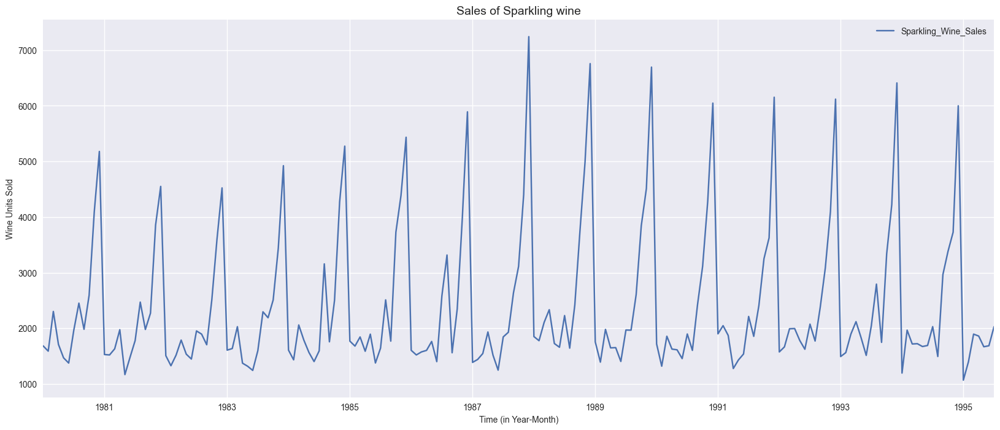

In [14]:
#Plot the Time Series to understand the behaviour of the data
rcParams['figure.figsize'] = 20,8
df.plot(grid=True);
plt.title('Sales of Sparkling wine', fontsize=14)
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

In [15]:
#Perform appropriate Exploratory Data Analysis to understand the data and also perform decomposition
df.head()

,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


In [16]:
#Check the basic measures of descriptive statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Sparkling_Wine_Sales,187.0,2402.417112,1295.11154,1070.0,1605.0,1874.0,2549.0,7242.0


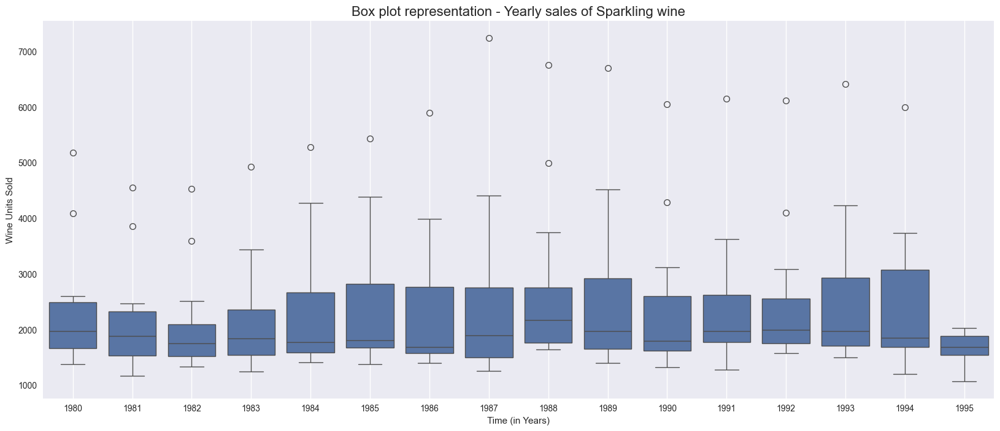

In [17]:
#Plot a boxplot to understand the spread of sales across different years and within different months across years.
_, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x = df.index.year,y = df.values[:,0],ax=ax)
plt.title('Box plot representation - Yearly sales of Sparkling wine', fontsize=16)
plt.xlabel('Time (in Years)')
plt.ylabel('Wine Units Sold')
plt.grid();

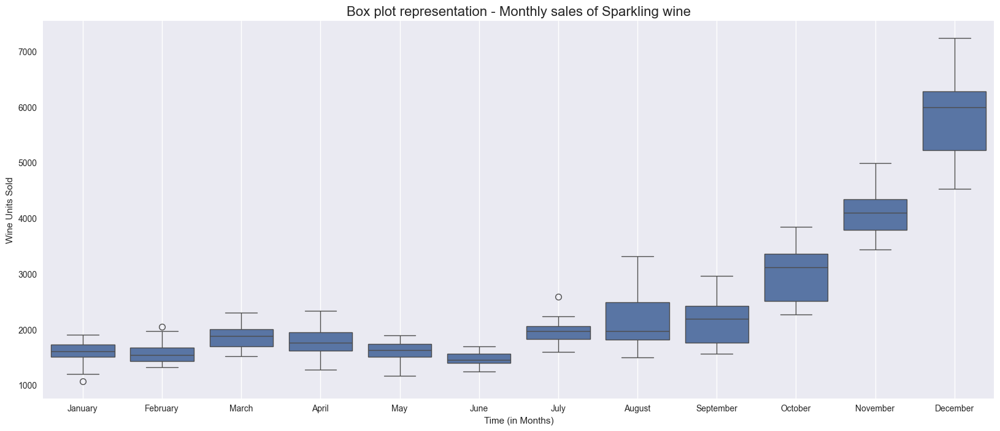

In [18]:
_, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x = df.index.month_name(),y = df.values[:,0],ax=ax)
plt.title('Box plot representation - Monthly sales of Sparkling wine', fontsize=16)
plt.xlabel('Time (in Months)')
plt.ylabel('Wine Units Sold')
plt.grid();

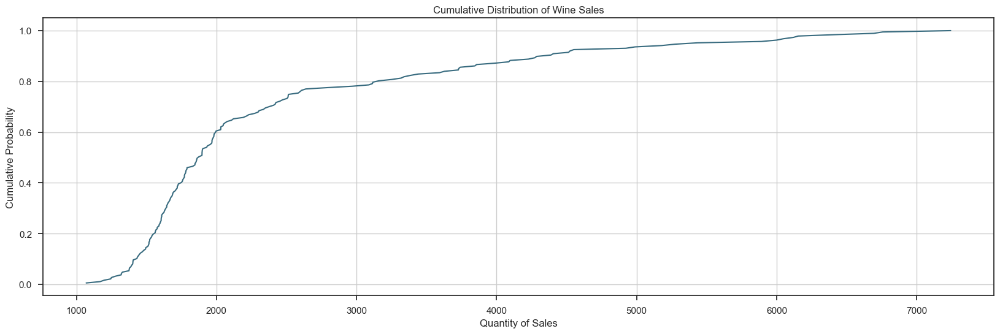

In [19]:
#Plot the empirical cumulative Distribution function
#Plot ECDF: Empirical Cumulative Distribution Function
#ECDF - Adds up the number of observations that are there for a certain value.
sns.set(style = "ticks")# to format into seaborn 
c = '#386B7F' # basic color for plots
plt.figure(figsize = (20, 20))


plt.subplot(312)
cdf = ECDF(df['Sparkling_Wine_Sales'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = c)
plt.title('Cumulative Distribution of Wine Sales')
plt.xlabel('Quantity of Sales');
plt.ylabel('Cumulative Probability')
plt.grid(True)
plt.show()

In [20]:
#Monthly sales across years.
monthly_sales_across_years = pd.pivot_table(df, values = 'Sparkling_Wine_Sales', columns = df.index.month_name(), index = df.index.year)
monthly_sales_across_years

Time_Stamp,April,August,December,February,January,July,June,March,May,November,October,September
Time_Stamp,,,,,,,,,,,,
1980,1712.0,2453.0,5179.0,1591.0,1686.0,1966.0,1377.0,2304.0,1471.0,4087.0,2596.0,1984.0
1981,1976.0,2472.0,4551.0,1523.0,1530.0,1781.0,1480.0,1633.0,1170.0,3857.0,2273.0,1981.0
1982,1790.0,1897.0,4524.0,1329.0,1510.0,1954.0,1449.0,1518.0,1537.0,3593.0,2514.0,1706.0
1983,1375.0,2298.0,4923.0,1638.0,1609.0,1600.0,1245.0,2030.0,1320.0,3440.0,2511.0,2191.0
1984,1789.0,3159.0,5274.0,1435.0,1609.0,1597.0,1404.0,2061.0,1567.0,4273.0,2504.0,1759.0
1985,1589.0,2512.0,5434.0,1682.0,1771.0,1645.0,1379.0,1846.0,1896.0,4388.0,3727.0,1771.0
1986,1605.0,3318.0,5891.0,1523.0,1606.0,2584.0,1403.0,1577.0,1765.0,3987.0,2349.0,1562.0
1987,1935.0,1930.0,7242.0,1442.0,1389.0,1847.0,1250.0,1548.0,1518.0,4405.0,3114.0,2638.0
1988,2336.0,1645.0,6757.0,1779.0,1853.0,2230.0,1661.0,2108.0,1728.0,4988.0,3740.0,2421.0


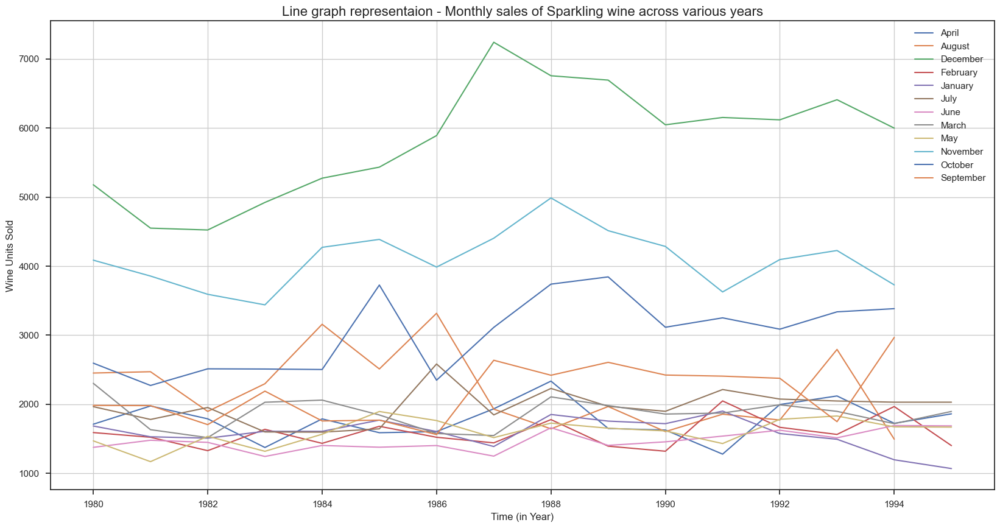

In [21]:
monthly_sales_across_years.plot(figsize=(20,10))
plt.grid();
plt.title('Line graph representaion - Monthly sales of Sparkling wine across various years', fontsize=16)
plt.xlabel('Time (in Year)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best');

In [22]:
#Resampling monthly data into a quarterly and yearly format
#Yearly plot

df_yearly_sum = df.resample('A').sum()
df_yearly_sum

,Sparkling_Wine_Sales
Time_Stamp,
1980-12-31,28406
1981-12-31,26227
1982-12-31,25321
1983-12-31,26180
1984-12-31,28431
1985-12-31,29640
1986-12-31,29170
1987-12-31,30258
1988-12-31,33246


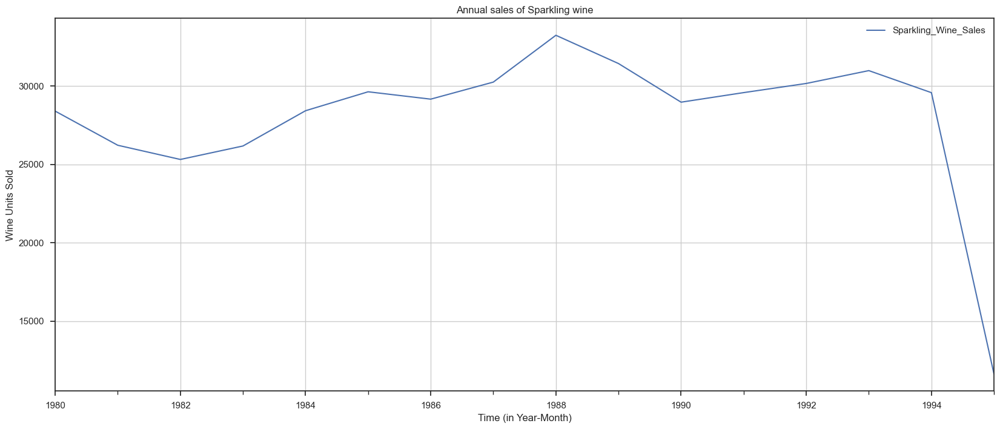

In [23]:
df_yearly_sum.plot();
plt.grid()
plt.title('Annual sales of Sparkling wine');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold');

In [24]:
#Quarterly Plot
df_quarterly_sum = df.resample('Q').sum()
df_quarterly_sum.head(10)

,Sparkling_Wine_Sales
Time_Stamp,
1980-03-31,5581
1980-06-30,4560
1980-09-30,6403
1980-12-31,11862
1981-03-31,4686
1981-06-30,4626
1981-09-30,6234
1981-12-31,10681
1982-03-31,4357


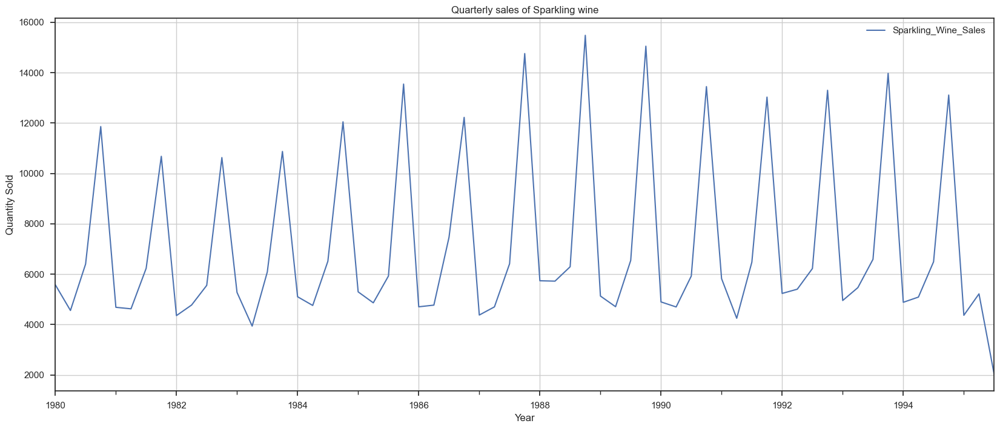

In [25]:
df_quarterly_sum.plot();
plt.grid()
plt.title('Quarterly sales of Sparkling wine');
plt.xlabel('Year')
plt.ylabel('Quantity Sold');

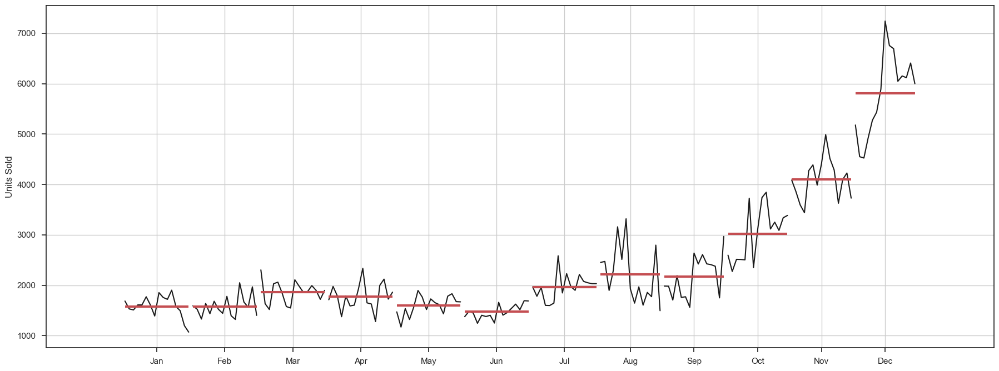

In [26]:
#Month plot of times series
from statsmodels.graphics.tsaplots import month_plot

fig, ax = plt.subplots(figsize=(22,8))

month_plot(df,ylabel='Units Sold',ax=ax)
plt.grid();

In [27]:
#Plot the average sales per month and the month on month percentage change of sales.
df.groupby(by=df.index)["Sparkling_Wine_Sales"].mean()

Time_Stamp
1980-01-31    1686.0
1980-02-29    1591.0
1980-03-31    2304.0
1980-04-30    1712.0
1980-05-31    1471.0
               ...  
1995-03-31    1897.0
1995-04-30    1862.0
1995-05-31    1670.0
1995-06-30    1688.0
1995-07-31    2031.0
Name: Sparkling_Wine_Sales, Length: 187, dtype: float64

In [28]:
df.groupby(by=df.index)["Sparkling_Wine_Sales"].sum().pct_change()

Time_Stamp
1980-01-31         NaN
1980-02-29   -0.056346
1980-03-31    0.448146
1980-04-30   -0.256944
1980-05-31   -0.140771
                ...   
1995-03-31    0.353067
1995-04-30   -0.018450
1995-05-31   -0.103115
1995-06-30    0.010778
1995-07-31    0.203199
Name: Sparkling_Wine_Sales, Length: 187, dtype: float64

Text(0, 0.5, '% Change')

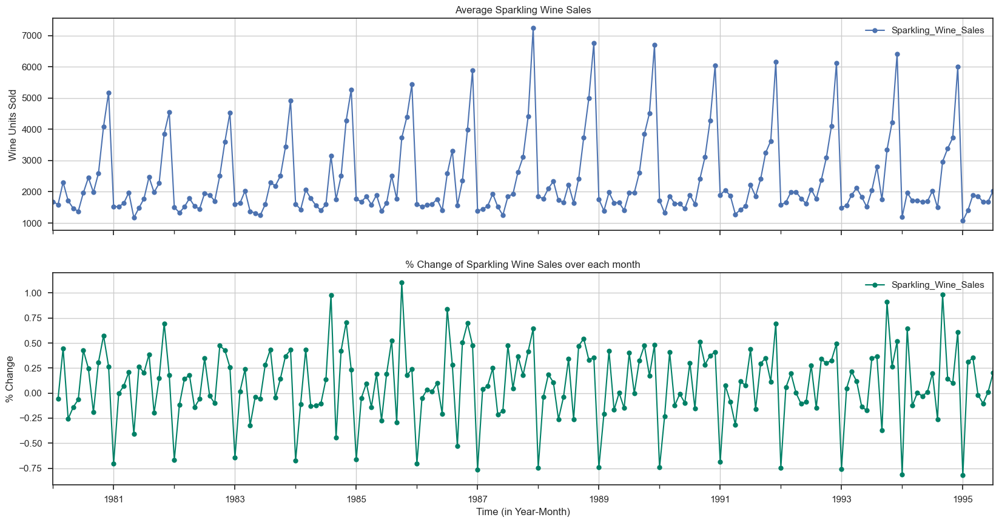

In [29]:
#group by date and get average RetailSales, and percent change
average    = df.groupby(by=df.index)["Sparkling_Wine_Sales"].mean()
pct_change = df.groupby(by=df.index)["Sparkling_Wine_Sales"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(20,10))
#plot average RetailSales over time(year-month)
ax1 = average.plot(legend=True,ax=axis1,marker='o',title="Average Sparkling Wine Sales",grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
ax1.set_ylabel('Wine Units Sold')

#plot precent change for RetailSales over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2,marker='o',colormap="summer",title="% Change of Sparkling Wine Sales over each month",grid=True)
plt.xlabel('Time (in Year-Month)')
ax2.set_ylabel('% Change')

<Figure size 2000x800 with 0 Axes>

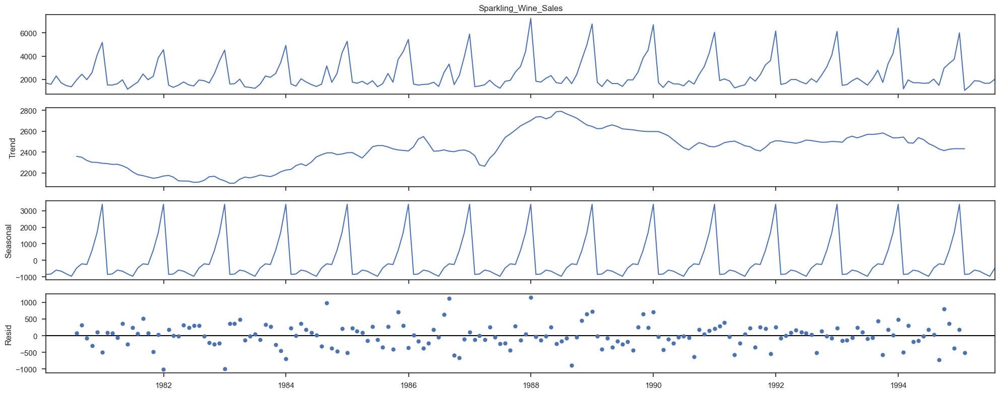

In [30]:
#Decomposition of the Time Series
#Additive decomposition
plt.figure(figsize=(20,8))
decomposition = seasonal_decompose(df['Sparkling_Wine_Sales'],model='additive')
decomposition.plot();
plt.show()

In [31]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Time_Stamp
1980-01-31            NaN
1980-02-29            NaN
1980-03-31            NaN
1980-04-30            NaN
1980-05-31            NaN
1980-06-30            NaN
1980-07-31    2360.666667
1980-08-31    2351.333333
1980-09-30    2320.541667
1980-10-31    2303.583333
1980-11-30    2302.041667
1980-12-31    2293.791667
Name: trend, dtype: float64 

Seasonality 
 Time_Stamp
1980-01-31    -854.260599
1980-02-29    -830.350678
1980-03-31    -592.356630
1980-04-30    -658.490559
1980-05-31    -824.416154
1980-06-30    -967.434011
1980-07-31    -465.502265
1980-08-31    -214.332821
1980-09-30    -254.677265
1980-10-31     599.769957
1980-11-30    1675.067179
1980-12-31    3386.983846
Name: seasonal, dtype: float64 

Residual 
 Time_Stamp
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31     70.835599
1980-08-31    315.999487
1980-09-30    -81.864401
1980-10-31   -307.3532

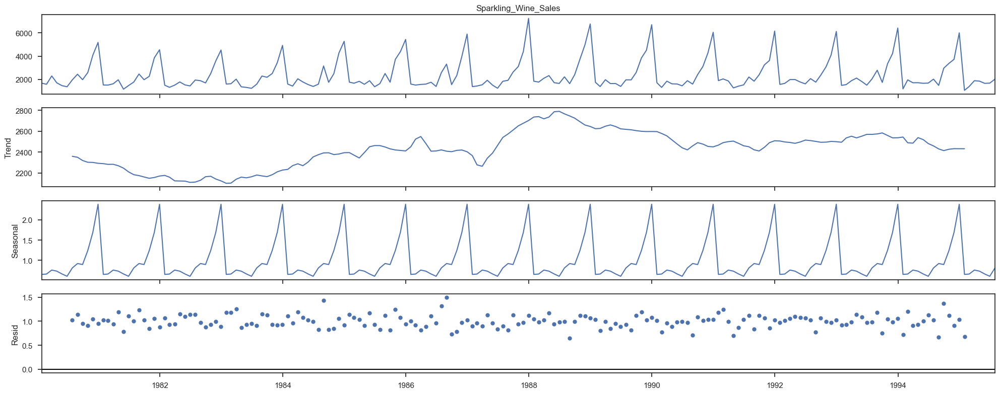

In [32]:
#Multiplicative Decomposition
decomposition = seasonal_decompose(df['Sparkling_Wine_Sales'],model='multiplicative')
decomposition.plot();

In [33]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Time_Stamp
1980-01-31            NaN
1980-02-29            NaN
1980-03-31            NaN
1980-04-30            NaN
1980-05-31            NaN
1980-06-30            NaN
1980-07-31    2360.666667
1980-08-31    2351.333333
1980-09-30    2320.541667
1980-10-31    2303.583333
1980-11-30    2302.041667
1980-12-31    2293.791667
Name: trend, dtype: float64 

Seasonality 
 Time_Stamp
1980-01-31    0.649843
1980-02-29    0.659214
1980-03-31    0.757440
1980-04-30    0.730351
1980-05-31    0.660609
1980-06-30    0.603468
1980-07-31    0.809164
1980-08-31    0.918822
1980-09-30    0.894367
1980-10-31    1.241789
1980-11-30    1.690158
1980-12-31    2.384776
Name: seasonal, dtype: float64 

Residual 
 Time_Stamp
1980-01-31         NaN
1980-02-29         NaN
1980-03-31         NaN
1980-04-30         NaN
1980-05-31         NaN
1980-06-30         NaN
1980-07-31    1.029230
1980-08-31    1.135407
1980-09-30    0.955954
1980-10-31    0.907513
1980-11-30    1.050423
1980-12-31    0.946770
Name: r

In [34]:
#Split the data into training and test. The test data should start in 1991
#Splitting the data into training and testing
train = df[df.index.year < 1991]
test = df[df.index.year >= 1991]
from IPython.display import display
print('First few rows of Training Data')
display(train.head(10))
print('Last few rows of Training Data')
display(train.tail(10))

First few rows of Training Data


,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471
1980-06-30,1377
1980-07-31,1966
1980-08-31,2453
1980-09-30,1984


Last few rows of Training Data


,Sparkling_Wine_Sales
Time_Stamp,
1990-03-31,1859
1990-04-30,1628
1990-05-31,1615
1990-06-30,1457
1990-07-31,1899
1990-08-31,1605
1990-09-30,2424
1990-10-31,3116
1990-11-30,4286


In [35]:
print('First few rows of Test Data')
display(test.head(10))
print('Last few rows of Test Data')
display(test.tail(10))

First few rows of Test Data


,Sparkling_Wine_Sales
Time_Stamp,
1991-01-31,1902
1991-02-28,2049
1991-03-31,1874
1991-04-30,1279
1991-05-31,1432
1991-06-30,1540
1991-07-31,2214
1991-08-31,1857
1991-09-30,2408


Last few rows of Test Data


,Sparkling_Wine_Sales
Time_Stamp,
1994-10-31,3385
1994-11-30,3729
1994-12-31,5999
1995-01-31,1070
1995-02-28,1402
1995-03-31,1897
1995-04-30,1862
1995-05-31,1670
1995-06-30,1688


In [36]:
print('-------------------------------------')
print('Number of observations in Train data   :  ',train.shape)
print('Number of observations in Test data    :  ',test.shape)
print('Total Observations                     :  ',test.shape[0]+train.shape[0])
print('-------------------------------------')

-------------------------------------
Number of observations in Train data   :   (132, 1)
Number of observations in Test data    :   (55, 1)
Total Observations                     :   187
-------------------------------------


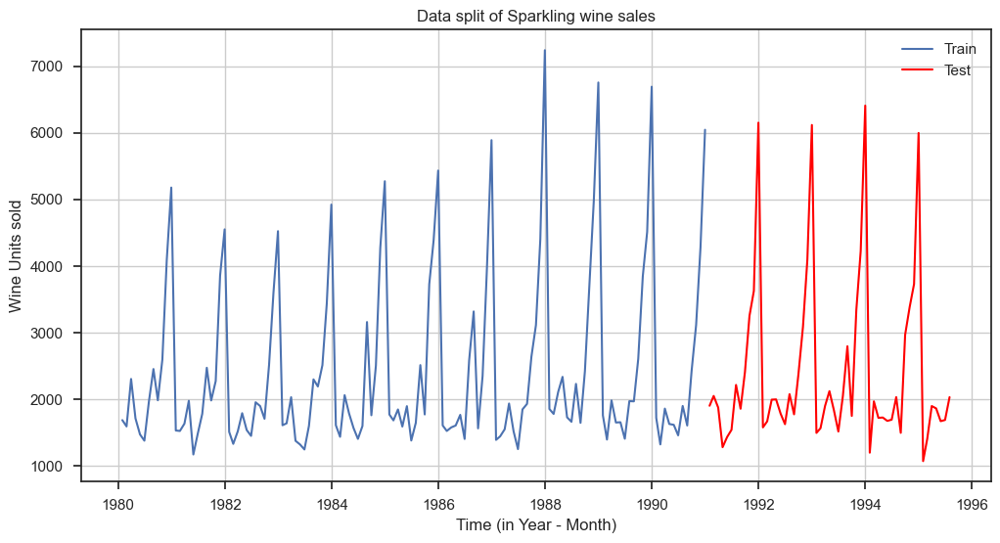

In [37]:
plt.figure(figsize = (12, 6))
plt.plot(train['Sparkling_Wine_Sales'], label = 'Train')
plt.plot(test['Sparkling_Wine_Sales'], label = 'Test', color='Red')
plt.legend(loc='best')
plt.xlabel('Time (in Year - Month)')
plt.ylabel('Wine Units sold')
plt.title('Data split of Sparkling wine sales', fontsize = 12)
plt.show;
plt.grid();

In [38]:
#Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other models such as regression,naïve forecast models and simple average models. should also be built on the training data and check the performance on the test data using RMSE.
#Model 1: Linear Regression
train_time = [i+1 for i in range(len(train))]
test_time = [i+len(train)+1 for i in range(len(test))]
print('Training Time instance','\n',train_time)
print('\n')
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]


Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [39]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [40]:
LinearRegression_train['Time'] = train_time
LinearRegression_test['Time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Sparkling_Wine_Sales  Time
Time_Stamp                            
1980-01-31                  1686     1
1980-02-29                  1591     2
1980-03-31                  2304     3
1980-04-30                  1712     4
1980-05-31                  1471     5 

Last few rows of Training Data 
             Sparkling_Wine_Sales  Time
Time_Stamp                            
1990-08-31                  1605   128
1990-09-30                  2424   129
1990-10-31                  3116   130
1990-11-30                  4286   131
1990-12-31                  6047   132 

First few rows of Test Data 
             Sparkling_Wine_Sales  Time
Time_Stamp                            
1991-01-31                  1902   133
1991-02-28                  2049   134
1991-03-31                  1874   135
1991-04-30                  1279   136
1991-05-31                  1432   137 

Last few rows of Test Data 
             Sparkling_Wine_Sales  Time
Time_Stamp

In [41]:
from sklearn.linear_model import LinearRegression

In [42]:
lr = LinearRegression()

In [43]:
lr.fit(LinearRegression_train[['Time']],LinearRegression_train['Sparkling_Wine_Sales'].values)

LinearRegression()

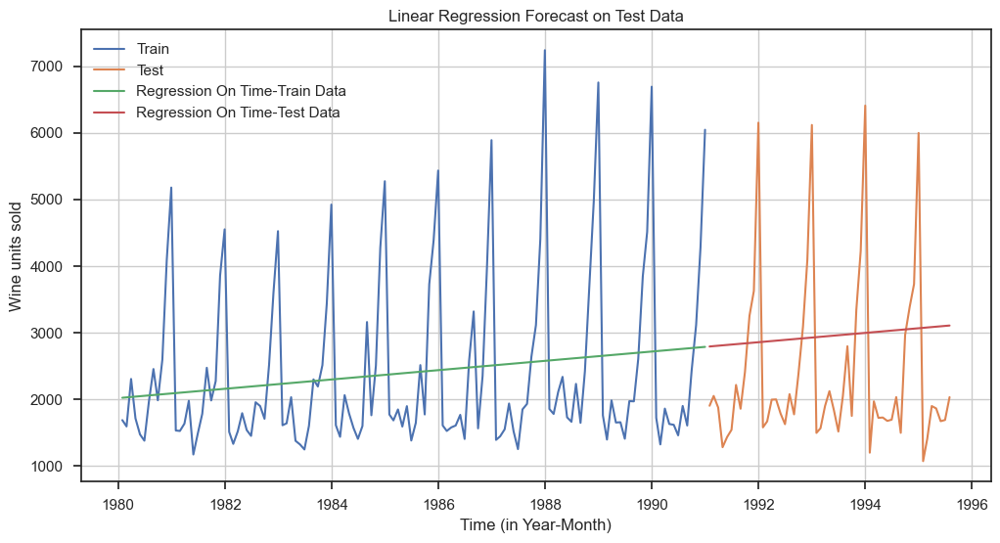

In [44]:
test_predictions_model1 = lr.predict(LinearRegression_test[['Time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

train_predictions_model1 = lr.predict(LinearRegression_train[['Time']])
LinearRegression_train['RegOnTime'] = train_predictions_model1

plt.figure(figsize=(12,6))
plt.title('Linear Regression Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')
plt.plot( train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')
plt.plot(LinearRegression_train['RegOnTime'], label='Regression On Time-Train Data')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time-Test Data')
plt.legend(loc='best')
plt.grid();

In [45]:
#Model evaluation - Linear Regression
#Test Data - RMSE

rmse_LR_test = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],LinearRegression_test['RegOnTime'],squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f" %(rmse_LR_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 1389.135


In [46]:
resultsDf = pd.DataFrame({'Test RMSE': [rmse_LR_test]},index=['Linear Regression'])
resultsDf

,Test RMSE
Linear Regression,1389.135175


In [47]:
#Model 2: Naive Forecast 
#For this particular naive model, we say that the prediction for tomorrow is the same as today and the prediction for day after tomorrow is tomorrow and since the prediction of tomorrow is same as today,therefore the prediction for day after tomorrow is also today.
NaiveModel_train = train.copy()
NaiveModel_test = test.copy()

In [48]:
#Taking the last value in the train data
NaiveModel_test['naive'] = np.asarray(train['Sparkling_Wine_Sales'])[len(np.asarray(train['Sparkling_Wine_Sales']))-1]
NaiveModel_test['naive'].head()

Time_Stamp
1991-01-31    6047
1991-02-28    6047
1991-03-31    6047
1991-04-30    6047
1991-05-31    6047
Name: naive, dtype: int64

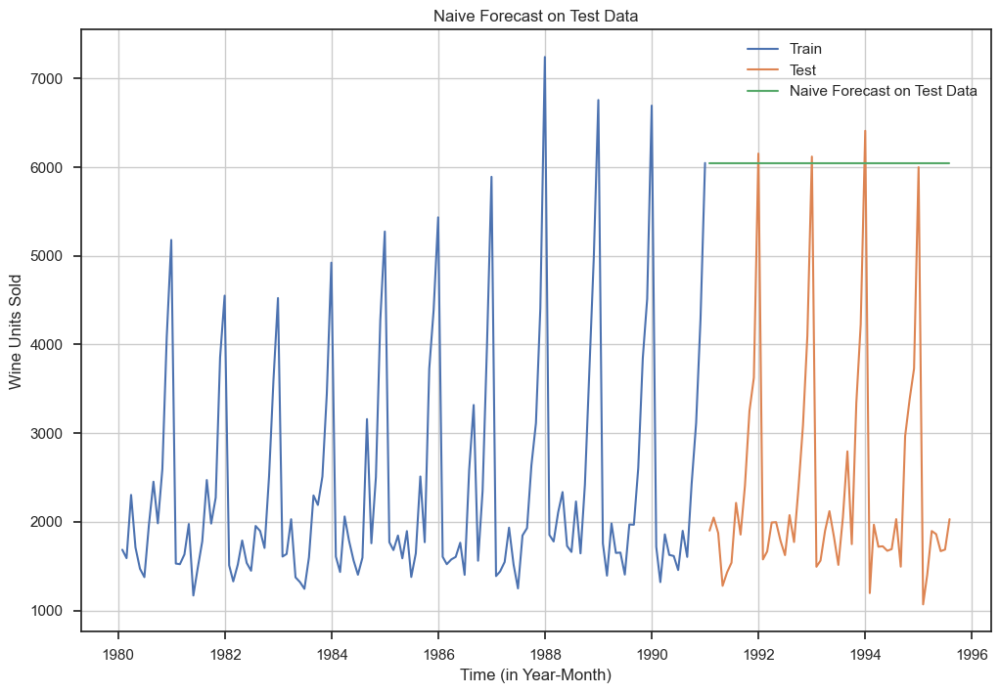

In [49]:
plt.figure(figsize=(12,8))
plt.title('Naive Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.plot(NaiveModel_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')
plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')
plt.legend(loc='best')
plt.grid();

In [50]:
#Model Evauation - Naive Forecast Model
#Testing Data - RMSE and MAPE

rmse_Naive_test = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],NaiveModel_test['naive'],squared=False)
print("For Naive forecast on the Testing Data:  RMSE is %3.3f " %(rmse_Naive_test))

For Naive forecast on the Testing Data:  RMSE is 3864.279 


In [51]:
resultsDf2 = pd.DataFrame({'Test RMSE': [rmse_Naive_test]},index=['Naive Model'])

resultsDf = pd.concat([resultsDf, resultsDf2])
resultsDf

,Test RMSE
Linear Regression,1389.135175
Naive Model,3864.279352


In [52]:
#Method 3: Simple Average
#For this particular simple average method, we will forecast by using the average of the training values.
SimpleAverage_train = train.copy()
SimpleAverage_test = test.copy()

In [53]:
SimpleAverage_test['mean_forecast'] = train['Sparkling_Wine_Sales'].mean()
SimpleAverage_test.head()

,Sparkling_Wine_Sales,mean_forecast
Time_Stamp,,
1991-01-31,1902,2403.780303
1991-02-28,2049,2403.780303
1991-03-31,1874,2403.780303
1991-04-30,1279,2403.780303
1991-05-31,1432,2403.780303


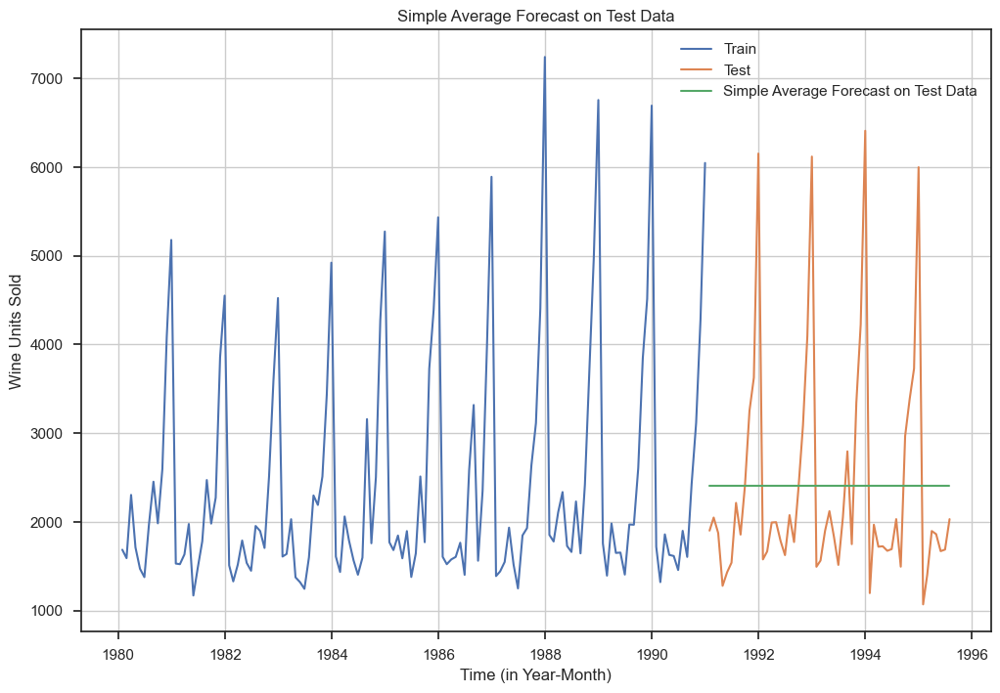

In [54]:
plt.figure(figsize=(12,8))
plt.title('Simple Average Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.plot(SimpleAverage_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(SimpleAverage_test['Sparkling_Wine_Sales'], label='Test')
plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average Forecast on Test Data')
plt.legend(loc='best')
plt.grid();

In [55]:
#Model Evauation - Simple Average Model
#Test Data - RMSE 

rmse_simple_average_test = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],SimpleAverage_test['mean_forecast'],squared=False)
print("For Simple Average forecast on the Test Data,  RMSE is %3.3f" %(rmse_simple_average_test))

For Simple Average forecast on the Test Data,  RMSE is 1275.082


In [56]:
resultsDf3 = pd.DataFrame({'Test RMSE': [rmse_simple_average_test]},index=['Simple Average'])

resultsDf = pd.concat([resultsDf, resultsDf3])
resultsDf

,Test RMSE
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average,1275.081804


In [57]:
#Model 4: Moving Average (MA)
#For the moving average model, we are going to calculate rolling means (or moving averages) for different intervals. The best interval can be determined by the maximum accuracy (or the minimum error) over here.
#For Moving Average, we are going to average over the entire data.
MovingAverage = df.copy()
MovingAverage.head()

,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


In [58]:
#Trailing moving averages
MovingAverage['Trailing_2'] = MovingAverage['Sparkling_Wine_Sales'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Sparkling_Wine_Sales'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Sparkling_Wine_Sales'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Sparkling_Wine_Sales'].rolling(9).mean()

MovingAverage.head(9)

,Sparkling_Wine_Sales,Trailing_2,Trailing_4,Trailing_6,Trailing_9
Time_Stamp,,,,,
1980-01-31,1686,NaN,NaN,NaN,NaN
1980-02-29,1591,1638.5,NaN,NaN,NaN
1980-03-31,2304,1947.5,NaN,NaN,NaN
1980-04-30,1712,2008.0,1823.25,NaN,NaN
1980-05-31,1471,1591.5,1769.50,NaN,NaN
1980-06-30,1377,1424.0,1716.00,1690.166667,NaN
1980-07-31,1966,1671.5,1631.50,1736.833333,NaN
1980-08-31,2453,2209.5,1816.75,1880.500000,NaN
1980-09-30,1984,2218.5,1945.00,1827.166667,1838.222222


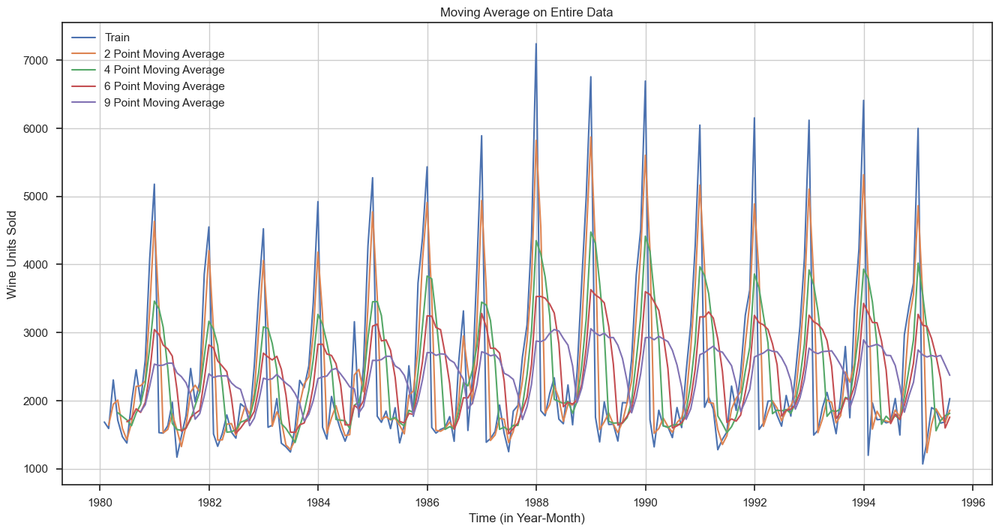

In [59]:
#Plotting on the whole data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')
plt.title('Moving Average on Entire Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

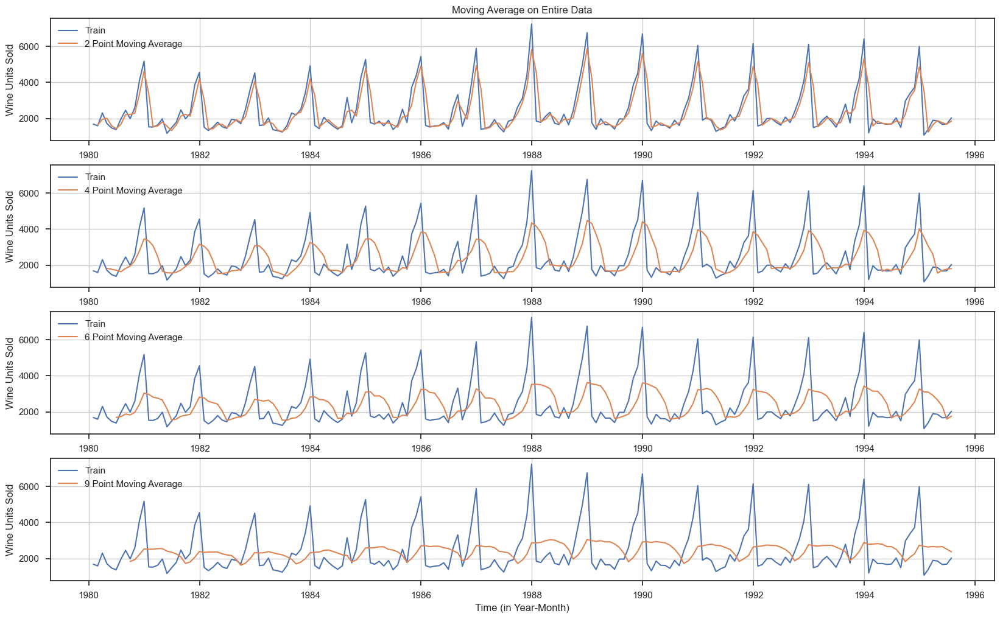

In [60]:
#Plotting on the whole data separately

plt.figure(figsize=(20,12))


plt.subplot(4,1,1)
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.title('Moving Average on Entire Data')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,2)
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,3)
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,4)
plt.plot(MovingAverage['Sparkling_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.xlabel('Time (in Year-Month)')
plt.legend(loc = 'best')

plt.grid();

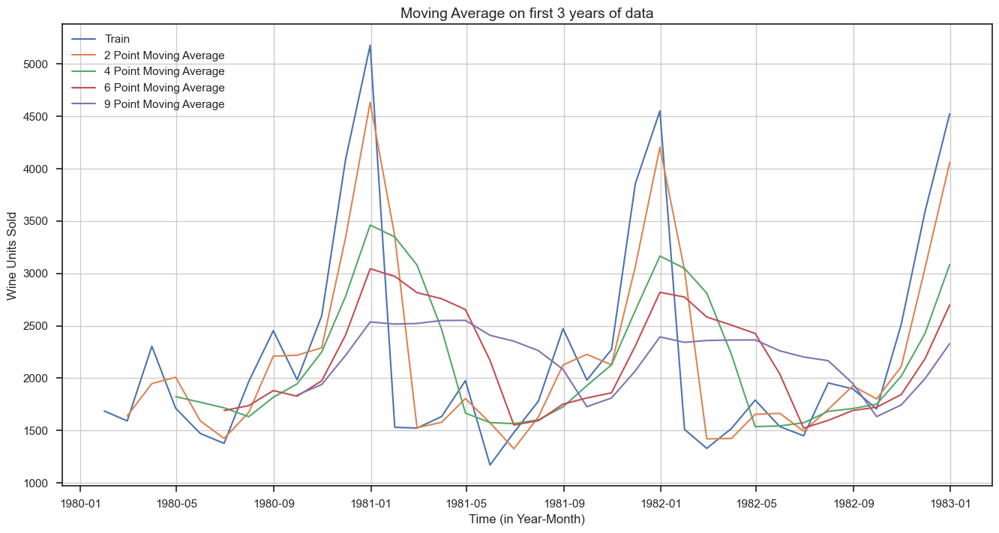

In [61]:
#Plotting on the first 3 years of data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage['Sparkling_Wine_Sales'].iloc[:-151], label='Train')
plt.plot(MovingAverage['Trailing_2'].iloc[:-151], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'].iloc[:-151], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'].iloc[:-151],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'].iloc[:-151],label = '9 Point Moving Average')
plt.title('Moving Average on first 3 years of data',fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

In [62]:
#Creating train and test set 
trailing_MovingAverage_train = MovingAverage[MovingAverage.index.year < 1991]
trailing_MovingAverage_test = MovingAverage[MovingAverage.index.year >= 1991]

Text(0.5, 1.0, 'Trailing Moving Average Forecast on Sparkling Wine Sales')

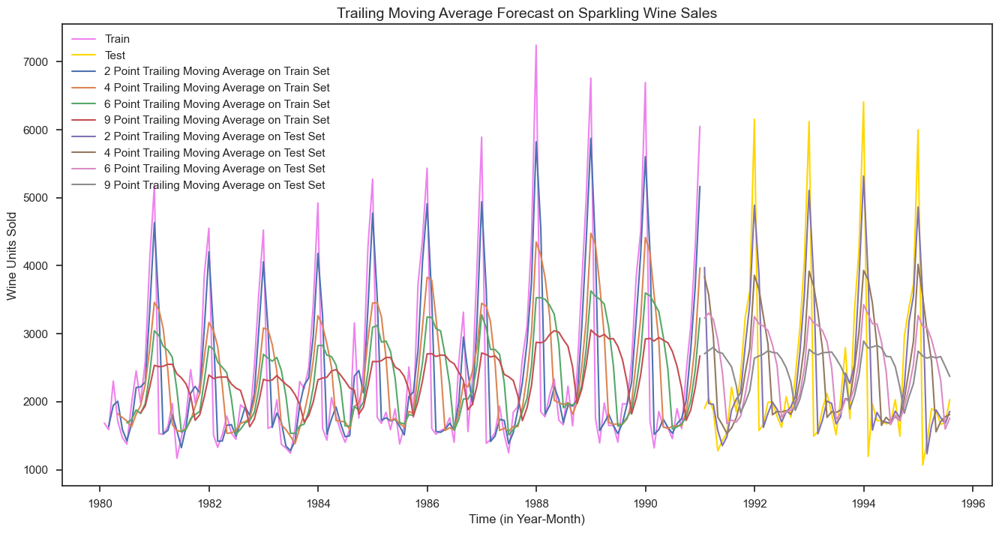

In [63]:
#Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train['Sparkling_Wine_Sales'], label='Train', color = 'violet')
plt.plot(trailing_MovingAverage_test['Sparkling_Wine_Sales'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_train['Trailing_2'], label='2 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_4'], label='4 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_6'],label = '6 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_9'],label = '9 Point Trailing Moving Average on Train Set')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

plt.title("Trailing Moving Average Forecast on Sparkling Wine Sales", fontsize=14)

In [64]:
#Model Evauation - Moving Average
#Test Data - RMSE --> 2 point Trailing MA

rmse_MA_test_2 = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],trailing_MovingAverage_test['Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_2))

#Test Data - RMSE --> 4 point Trailing MA

rmse_MA_test_4 = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],trailing_MovingAverage_test['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_4))

#Test Data - RMSE --> 6 point Trailing MA

rmse_MA_test_6 = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],trailing_MovingAverage_test['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_6))

#Test Data - RMSE --> 9 point Trailing MA

rmse_MA_test_9 = metrics.mean_squared_error(test['Sparkling_Wine_Sales'],trailing_MovingAverage_test['Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_9))

For 2 point Moving Average Model forecast on the Training Data,  RMSE is 813.401
For 4 point Moving Average Model forecast on the Training Data,  RMSE is 1156.590
For 6 point Moving Average Model forecast on the Training Data,  RMSE is 1283.927
For 9 point Moving Average Model forecast on the Training Data,  RMSE is 1346.278


In [65]:
resultsDf4 = pd.DataFrame({'Test RMSE': [rmse_MA_test_2,rmse_MA_test_4
                                          ,rmse_MA_test_6,rmse_MA_test_9]
                            }
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

resultsDf = pd.concat([resultsDf, resultsDf4])
resultsDf

,Test RMSE
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315


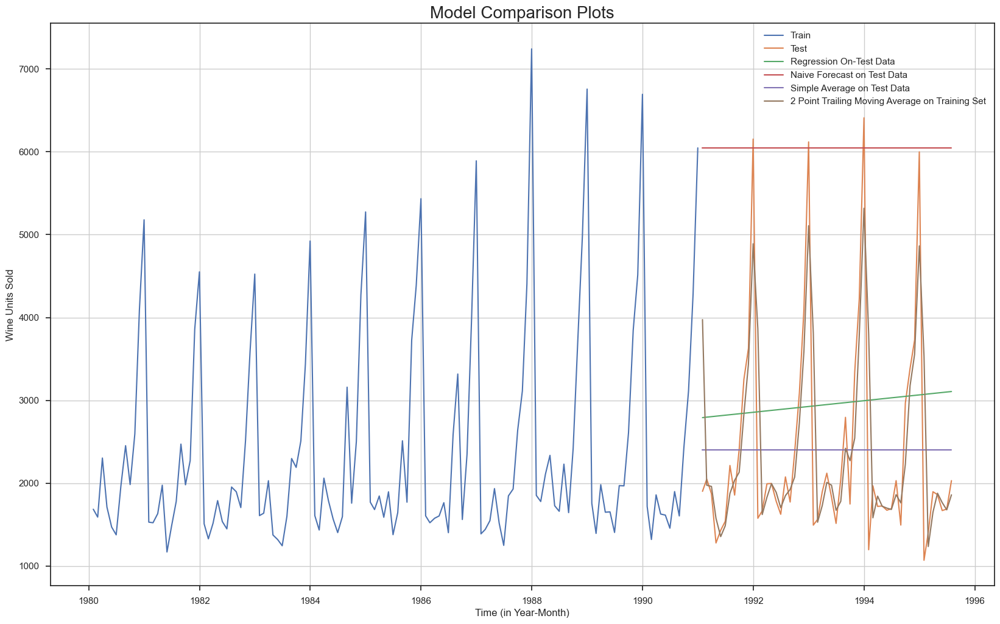

In [66]:
#Before we go on to build the various Exponential Smoothing models, let us plot all the models and compare the Time Series plots.
#Plotting on both Training and Test data

plt.figure(figsize=(20,12))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On-Test Data')

plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')


plt.legend(loc='best')
plt.title("Model Comparison Plots",fontsize=20)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

In [67]:
#Model 5: Simple Exponential Smoothing
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [68]:
SES_train = train.copy()
SES_test = test.copy()

In [69]:
model_SES = SimpleExpSmoothing(SES_train['Sparkling_Wine_Sales'])

In [70]:
#Fitting the Simple Exponential Smoothing model and asking python to choose the optimal parameters
model_SES_autofit = model_SES.fit(optimized=True)

In [71]:
model_SES_autofit.params

{'smoothing_level': 0.03953488372093023,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [72]:
SES_test['predict'] = model_SES_autofit.forecast(steps=len(test))
SES_test.head()

,Sparkling_Wine_Sales,predict
Time_Stamp,,
1991-01-31,1902,2676.676366
1991-02-28,2049,2676.676366
1991-03-31,1874,2676.676366
1991-04-30,1279,2676.676366
1991-05-31,1432,2676.676366


Text(0, 0.5, 'Wine Units Sold')

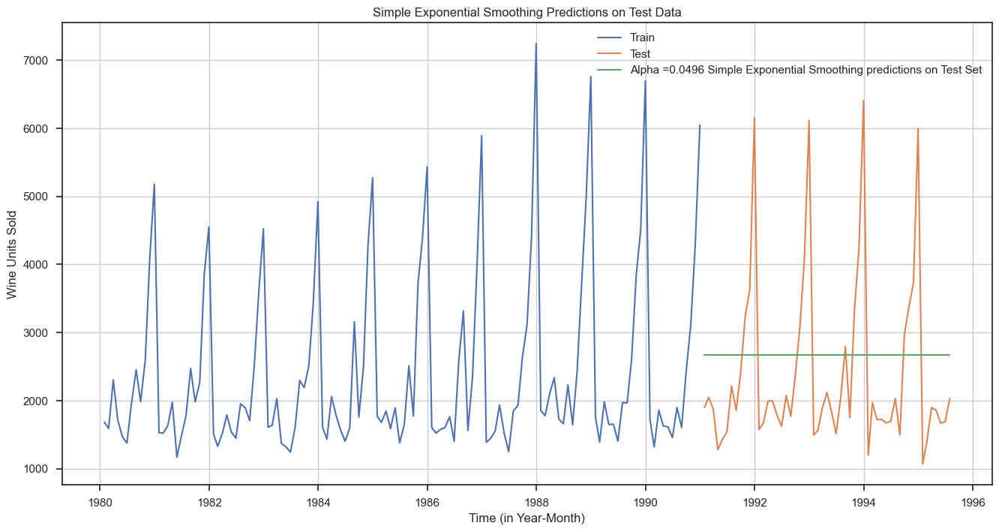

In [73]:
#Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(SES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(SES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha =0.0496 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple Exponential Smoothing Predictions on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [74]:
#Model Evaluation for α= 0.0496 : Simple Exponential Smoothing
#Test Data

rmse_model5_test_1 = metrics.mean_squared_error(SES_test['Sparkling_Wine_Sales'],SES_test['predict'],squared=False)
print("For Alpha =0.0496 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_model5_test_1))

For Alpha =0.0496 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is 1304.927


In [75]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_model5_test_1]},index=['Alpha =0.0496,SimpleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_5])
resultsDf

,Test RMSE
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha =0.0496,SimpleExponentialSmoothing",1304.927405


In [76]:
#First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha Values,Train RMSE,Test RMSE


In [77]:
for i in np.arange(0.1,1,0.05):
    model_SES_alpha_i = model_SES.fit(smoothing_level=i,optimized=False,use_brute=True)
    SES_train['predict',i] = model_SES_alpha_i.fittedvalues
    SES_test['predict',i] = model_SES_alpha_i.forecast(steps=len(test))
    
    rmse_model5_train_i = metrics.mean_squared_error(SES_train['Sparkling_Wine_Sales'],SES_train['predict',i],squared=False)
    
    rmse_model5_test_i = metrics.mean_squared_error(SES_test['Sparkling_Wine_Sales'],SES_test['predict',i],squared=False)
    
    resultsDf_6 = resultsDf_6.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i 
                                      ,'Test RMSE':rmse_model5_test_i}, ignore_index=True)

In [78]:
resultsDf_6.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Train RMSE,Test RMSE
0,0.10,1333.873836,1375.393398
1,0.15,1347.521016,1466.203651
2,0.20,1356.042987,1595.206839
3,0.25,1359.701408,1755.488175
4,0.30,1359.511747,1935.507132
5,0.35,1356.733677,2123.914871
6,0.40,1352.588879,2311.919615
7,0.45,1348.095362,2493.786514
8,0.50,1344.004369,2666.351413
9,0.55,1340.811249,2828.246418


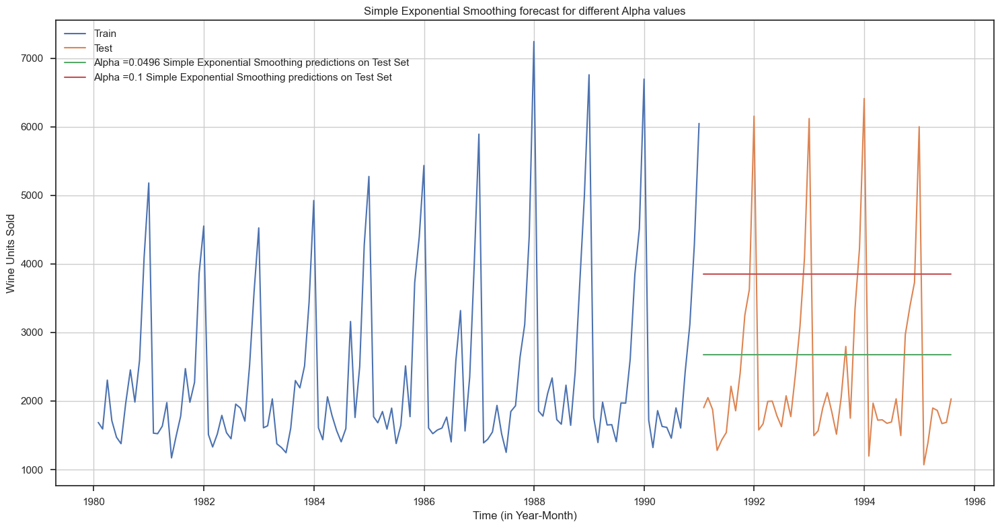

In [79]:
#Plotting on both the Training and Test data
model_SES_alpha_i = model_SES.fit(smoothing_level=0.3,optimized=False,use_brute=True)
SES_train['predict',0.1] = model_SES_alpha_i.fittedvalues
SES_test['predict',0.1] = model_SES_alpha_i.forecast(steps=len(test))

plt.figure(figsize=(18,9))
plt.plot(SES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(SES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha =0.0496 Simple Exponential Smoothing predictions on Test Set')

plt.plot(SES_test['predict',0.1], label='Alpha =0.1 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.title('Simple Exponential Smoothing forecast for different Alpha values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

In [80]:
#Method 6: Double Exponential Smoothing (Holt's Model)
#Two parameters α and β are estimated in this model. Level and Trend are accounted for in this model.
DES_train = train.copy()
DES_test = test.copy()

In [81]:
#Initializing the Double Exponential Smoothing Model
model_DES = Holt(DES_train)
#Fitting the model
model_DES = model_DES.fit(optimized=True, use_brute=True)

In [82]:
model_DES.params

{'smoothing_level': 0.6885714285714285,
 'smoothing_trend': 9.999999999999999e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': -95.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [83]:
#Forecasting using this model for the test set
DES_test['predict'] =  model_DES.forecast(len(test))
DES_test['predict']

Time_Stamp
1991-01-31    5221.278699
1991-02-28    5127.886554
1991-03-31    5034.494409
1991-04-30    4941.102264
1991-05-31    4847.710119
1991-06-30    4754.317974
1991-07-31    4660.925829
1991-08-31    4567.533684
1991-09-30    4474.141539
1991-10-31    4380.749394
1991-11-30    4287.357249
1991-12-31    4193.965104
1992-01-31    4100.572959
1992-02-29    4007.180813
1992-03-31    3913.788668
1992-04-30    3820.396523
1992-05-31    3727.004378
1992-06-30    3633.612233
1992-07-31    3540.220088
1992-08-31    3446.827943
1992-09-30    3353.435798
1992-10-31    3260.043653
1992-11-30    3166.651508
1992-12-31    3073.259363
1993-01-31    2979.867218
1993-02-28    2886.475073
1993-03-31    2793.082928
1993-04-30    2699.690783
1993-05-31    2606.298638
1993-06-30    2512.906493
1993-07-31    2419.514348
1993-08-31    2326.122203
1993-09-30    2232.730058
1993-10-31    2139.337913
1993-11-30    2045.945768
1993-12-31    1952.553623
1994-01-31    1859.161478
1994-02-28    1765.769333
1

Text(0, 0.5, 'Wine Units Sold')

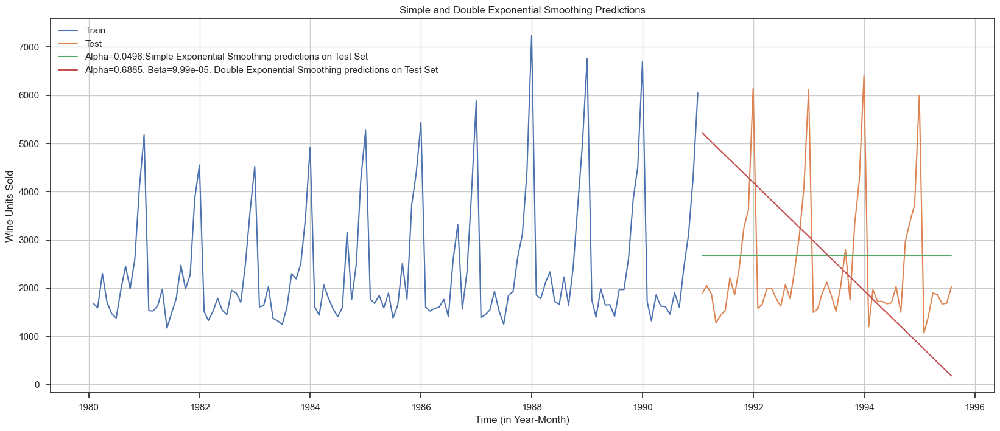

In [84]:
#Plotting the Training data, Test data and the forecasted values

plt.plot(DES_train, label='Train')
plt.plot(DES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha=0.0496:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict'], label='Alpha=0.6885, Beta=9.99e-05. Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [85]:
#Model Evaluation - Double Exponential Smoothing(Holt's Model)
rmse_DES_test = metrics.mean_squared_error(DES_test['Sparkling_Wine_Sales'],DES_test['predict'],squared=False)
print("For DES forecast on the Sparkling Testing Data:  RMSE is %3.3f" %(rmse_DES_test))

For DES forecast on the Sparkling Testing Data:  RMSE is 2007.239


In [86]:
resultsDf_6 = pd.DataFrame({'Test RMSE': [rmse_DES_test]},index=['Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6])
resultsDf

,Test RMSE
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha =0.0496,SimpleExponentialSmoothing",1304.927405
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",2007.238526


In [87]:
#First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha':[],'Beta':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha,Beta,Train RMSE,Test RMSE


In [88]:
model_DES = Holt(DES_train['Sparkling_Wine_Sales'])
for i in np.arange(0.05,1.05,0.05):
    for j in np.arange(0.05,1.05,0.05):
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i,smoothing_trend=j,optimized=False,use_brute=True)
        DES_train['predict',i,j] = model_DES_alpha_i_j.fittedvalues
        DES_test['predict',i,j] = model_DES_alpha_i_j.forecast(len(test))
        
        rmse_model6_train = metrics.mean_squared_error(DES_train['Sparkling_Wine_Sales'],DES_train['predict',i,j],squared=False)
        
        rmse_model6_test = metrics.mean_squared_error(DES_test['Sparkling_Wine_Sales'],DES_test['predict',i,j],squared=False)
        
        resultsDf_6 = resultsDf_6.append({'Alpha':i,'Beta':j,'Train RMSE':rmse_model6_train
                                          ,'Test RMSE':rmse_model6_test}, ignore_index=True)

In [89]:
resultsDf_6

,Alpha,Beta,Train RMSE,Test RMSE
0,0.05,0.05,1430.025526,1418.407668
1,0.05,0.10,1385.420826,1466.899629
2,0.05,0.15,1379.162520,1457.041594
3,0.05,0.20,1382.766405,1443.099273
4,0.05,0.25,1390.407645,1550.422496
...,...,...,...,...
395,1.00,0.80,1902.013709,55442.273880
396,1.00,0.85,1942.749655,56677.130498
397,1.00,0.90,1985.368445,57823.177011
398,1.00,0.95,2030.204345,58888.482146


In [90]:
resultsDf_6.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Test RMSE
0,0.05,0.05,1430.025526,1418.407668
3,0.05,0.20,1382.766405,1443.099273
2,0.05,0.15,1379.162520,1457.041594
1,0.05,0.10,1385.420826,1466.899629
6,0.05,0.35,1414.226231,1547.022626


Text(0, 0.5, 'Wine Units Sold')

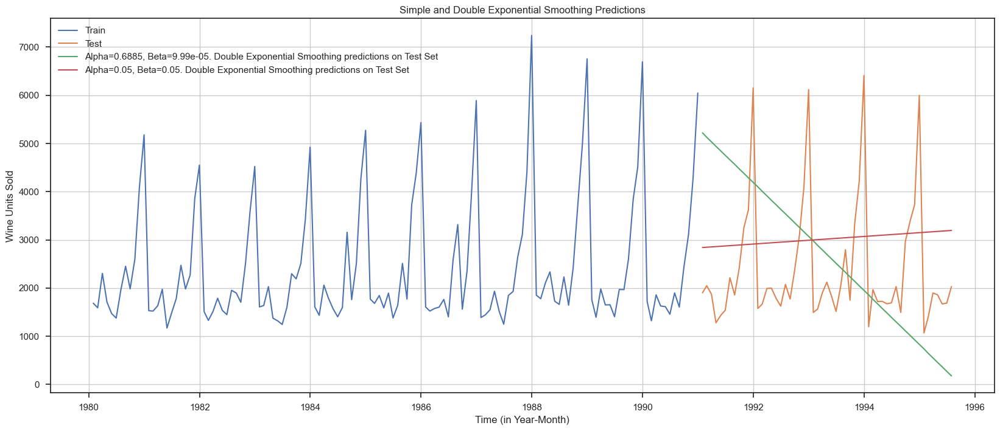

In [91]:
#Plotting the Training data, Test data and the forecasted values

plt.plot(DES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(DES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(DES_test['predict'], label='Alpha=0.6885, Beta=9.99e-05. Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict',0.05,0.05], label='Alpha=0.05, Beta=0.05. Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [92]:
DES_Model2_rmse = float(resultsDf_6[(resultsDf_6['Alpha']==0.05) & (resultsDf_6['Beta']==0.05)]['Test RMSE'])
DES_Model2_rmse

1418.4076682004925

In [93]:
resultsDf_6 = pd.DataFrame({'Test RMSE': [DES_Model2_rmse]},index=['Alpha=0.05, Beta=0.05, Double Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6])
resultsDf

,Test RMSE
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha =0.0496,SimpleExponentialSmoothing",1304.927405
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",2007.238526
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1418.407668


In [94]:
#Method 7: Triple Exponential Smoothing (Holt - Winter's Model)
#Three parameters α,β and γ are estimated in this model. Level, Trend and Seasonality are accounted for in this model.
TES_train = train.copy()
TES_test = test.copy()

In [95]:
model_TES = ExponentialSmoothing(TES_train['Sparkling_Wine_Sales'],trend='additive',seasonal='multiplicative',freq='M')

In [96]:
model_TES_autofit = model_TES.fit(optimized=True)

In [97]:
model_TES_autofit.params

{'smoothing_level': 0.11119949831569428,
 'smoothing_trend': 0.049430920023313805,
 'smoothing_seasonal': 0.3620525701498937,
 'damping_trend': nan,
 'initial_level': 2356.5264391986907,
 'initial_trend': -9.443690175376352,
 'initial_seasons': array([0.71325627, 0.68332509, 0.90537798, 0.80561841, 0.65639659,
        0.65451508, 0.88690241, 1.13423953, 0.91927727, 1.21396745,
        1.86941738, 2.3734461 ]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [98]:
#Prediction on the test data

TES_test['auto_predict'] = model_TES_autofit.forecast(steps=len(test))
TES_test.head()

,Sparkling_Wine_Sales,auto_predict
Time_Stamp,,
1991-01-31,1902,1587.685845
1991-02-28,2049,1356.590237
1991-03-31,1874,1763.121866
1991-04-30,1279,1656.379813
1991-05-31,1432,1542.186697


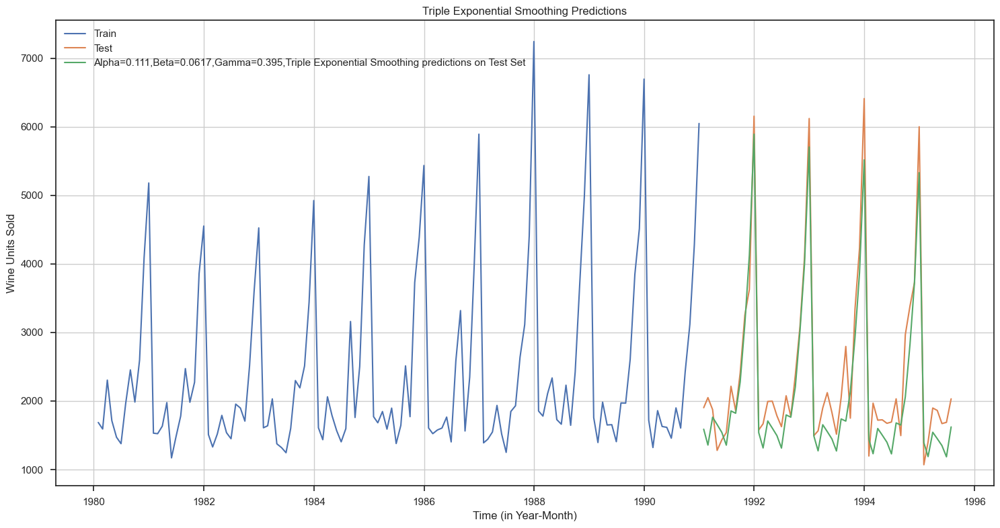

In [99]:
#Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(TES_test['Sparkling_Wine_Sales'], label='Test')

plt.plot(TES_test['auto_predict'], label='Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

In [100]:
#Test Data

rmse_tes_test = metrics.mean_squared_error(TES_test['Sparkling_Wine_Sales'],TES_test['auto_predict'],squared=False)
print("For Alpha=0.111,Beta=0.0617,Gamma=0.395, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is %3.3f" %(rmse_tes_test))

For Alpha=0.111,Beta=0.0617,Gamma=0.395, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is 403.706


In [101]:
resultsDf_7 = pd.DataFrame({'Test RMSE': [rmse_tes_test]}
                           ,index=['Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_7])
resultsDf

,Test RMSE
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha =0.0496,SimpleExponentialSmoothing",1304.927405
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",2007.238526
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1418.407668


In [102]:
#First we will define an empty dataframe to store our values from the loop

resultsDf_8_2 = pd.DataFrame({'Alpha':[],'Beta':[],'Gamma':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_8_2

,Alpha,Beta,Gamma,Train RMSE,Test RMSE


In [103]:
for i in np.arange(0.1,1.05,0.05):
    for j in np.arange(0.1,1.05,0.05):
        for k in np.arange(0.1,1.05,0.05):
            model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=False,use_brute=True)
            TES_train['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=len(test))
        
            rmse_model8_train = metrics.mean_squared_error(TES_train['Sparkling_Wine_Sales'],TES_train['predict',i,j,k],squared=False)
            
            rmse_model8_test = metrics.mean_squared_error(TES_test['Sparkling_Wine_Sales'],TES_test['predict',i,j,k],squared=False)
            
            resultsDf_8_2 = resultsDf_8_2.append({'Alpha':i,'Beta':j,'Gamma':k,
                                                  'Train RMSE':rmse_model8_train,'Test RMSE':rmse_model8_test}
                                                 , ignore_index=True)

In [104]:
resultsDf_8_2

,Alpha,Beta,Gamma,Train RMSE,Test RMSE
0,0.1,0.1,0.10,3.814397e+02,5.910387e+02
1,0.1,0.1,0.15,3.735719e+02,6.073917e+02
2,0.1,0.1,0.20,3.677929e+02,6.214407e+02
3,0.1,0.1,0.25,3.638217e+02,6.322427e+02
4,0.1,0.1,0.30,3.614334e+02,6.395595e+02
...,...,...,...,...,...
6854,1.0,1.0,0.80,1.101923e+06,2.700435e+05
6855,1.0,1.0,0.85,7.467886e+04,1.094394e+06
6856,1.0,1.0,0.90,7.695708e+04,2.472201e+05
6857,1.0,1.0,0.95,3.058385e+05,1.273915e+06


In [105]:
resultsDf_8_2.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Test RMSE
2168,0.40,0.1,0.20,384.467709,317.434302
1806,0.35,0.1,0.15,384.458451,321.078383
1122,0.25,0.2,0.15,391.339330,324.959874
2530,0.45,0.1,0.25,388.413304,325.857010
2169,0.40,0.1,0.25,383.050293,326.251722


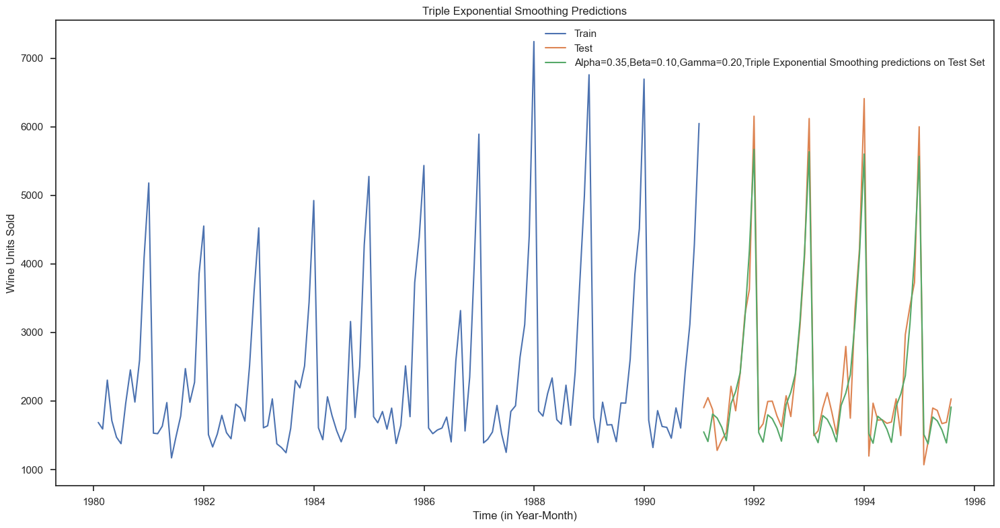

In [106]:
#Plotting on both the Training and Test data using brute force alpha, beta and gamma determination
model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=0.35,smoothing_trend=0.10,smoothing_seasonal=0.20,optimized=False,use_brute=True)
TES_train['predict',0.35,0.10,0.20] = model_TES_alpha_i_j_k.fittedvalues
TES_test['predict',0.35,0.10,0.20] = model_TES_alpha_i_j_k.forecast(steps=len(test))
rmse_tes_test_lowest = metrics.mean_squared_error(TES_test['Sparkling_Wine_Sales'],TES_test['predict',0.35,0.10,0.20],squared=False)

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(TES_test['Sparkling_Wine_Sales'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();
plt.grid();

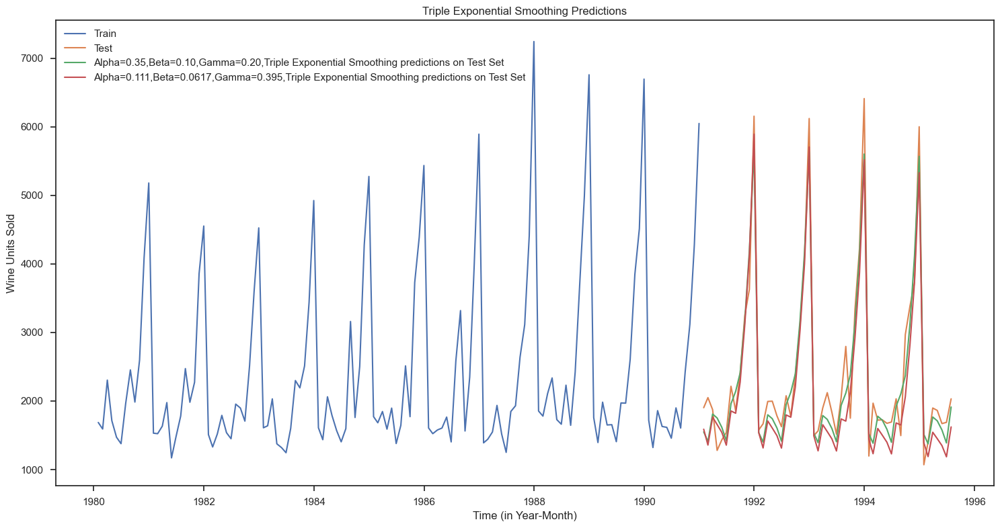

In [107]:
#Plotting on both the Training and Test data using brute force alpha, beta and gamma determination
model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=0.35,smoothing_trend=0.10,smoothing_seasonal=0.20,optimized=False,use_brute=True)
TES_train['predict',0.35,0.10,0.20] = model_TES_alpha_i_j_k.fittedvalues
TES_test['predict',0.35,0.10,0.20] = model_TES_alpha_i_j_k.forecast(steps=len(test))
rmse_tes_test_lowest = metrics.mean_squared_error(TES_test['Sparkling_Wine_Sales'],TES_test['predict',0.35,0.10,0.20],squared=False)

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling_Wine_Sales'], label='Train')
plt.plot(TES_test['Sparkling_Wine_Sales'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_test['auto_predict'], label='Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();
plt.grid();

In [108]:
resultsDf_8 = pd.DataFrame({'Test RMSE': [rmse_tes_test_lowest]}
                           ,index=['Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_8])
resultsDf

,Test RMSE
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha =0.0496,SimpleExponentialSmoothing",1304.927405
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",2007.238526
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1418.407668


In [109]:
print('Sorted by RMSE values on the Test Data:','\n',)
resultsDf.sort_values(by=['Test RMSE'])

Sorted by RMSE values on the Test Data: 



,Test RMSE
"Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing",331.037724
"Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing",403.706228
2 point TMA,813.400684
4 point TMA,1156.589694
Simple Average,1275.081804
6 point TMA,1283.927428
"Alpha =0.0496,SimpleExponentialSmoothing",1304.927405
9 point TMA,1346.278315
Linear Regression,1389.135175
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1418.407668


Text(0, 0.5, 'Wine Units Sold')

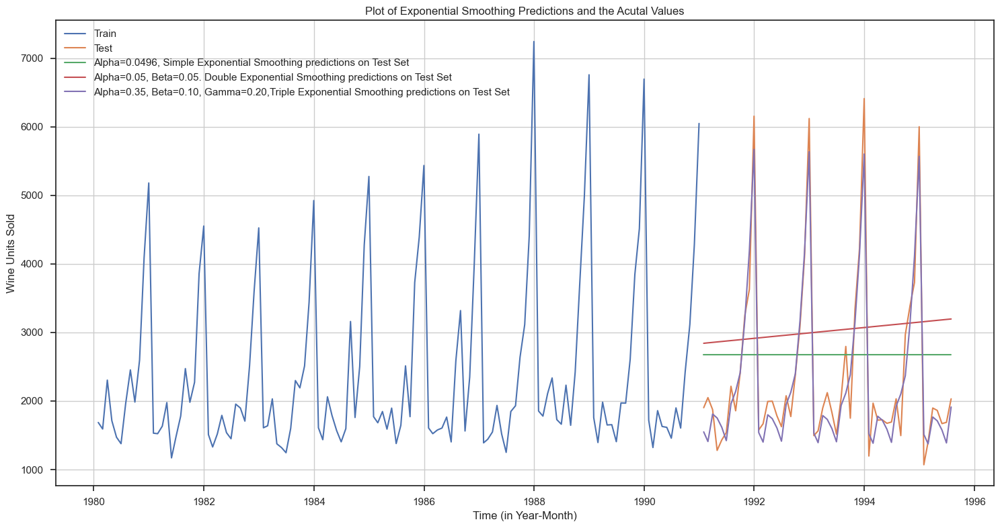

In [110]:
#Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha=0.0496, Simple Exponential Smoothing predictions on Test Set')

plt.plot(DES_test['predict',0.05,0.05], label='Alpha=0.05, Beta=0.05. Double Exponential Smoothing predictions on Test Set')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35, Beta=0.10, Gamma=0.20,Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Exponential Smoothing Predictions and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [111]:
#Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment. Note: Stationarity should be checked at alpha = 0.05.
from statsmodels.tsa.stattools import adfuller

In [112]:
print('Results of Dicky-Fuller Test')
dftest = adfuller(df,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test
DF test statistic is -1.798
DF test p-value is 0.7055958459932058
Number of lags used 12


In [113]:
print('Results of Dicky-Fuller Test with differencing')
dftest = adfuller(df.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test with differencing
DF test statistic is -44.912
DF test p-value is 0.0
Number of lags used 10


Text(0.5, 0, 'Time (in Year-Month)')

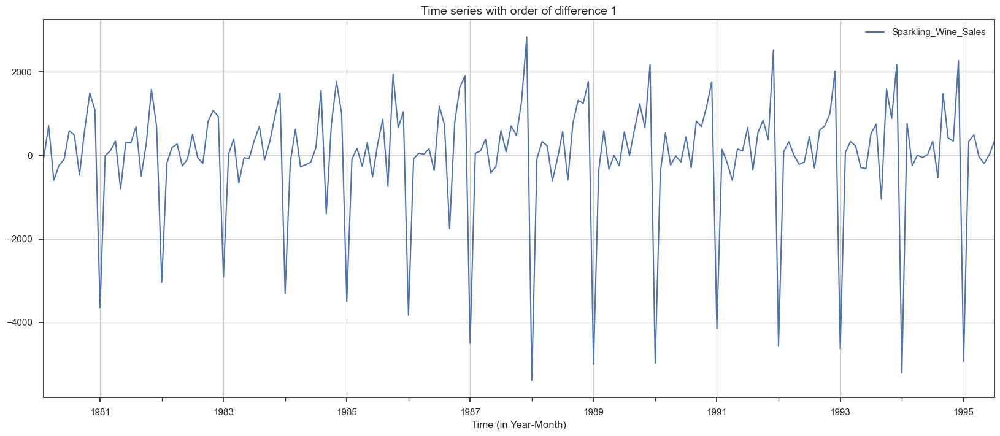

In [114]:
df.diff().dropna().plot(grid=True);
plt.title('Time series with order of difference 1', fontsize=14)
plt.xlabel('Time (in Year-Month)')

Text(0, 0.5, 'Correlation')

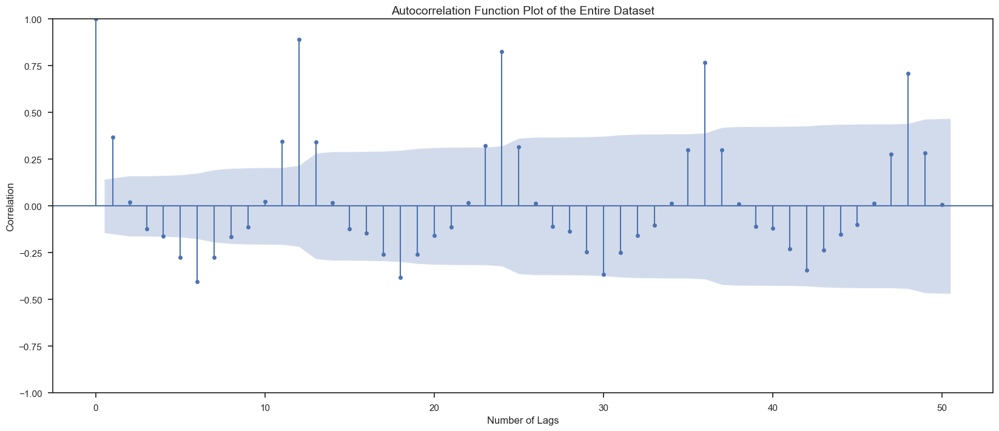

In [115]:
#Plot the Autocorrelation and the Partial Autocorrelation function plots on the whole data.
#ACF plot
plot_acf(df,alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the Entire Dataset', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

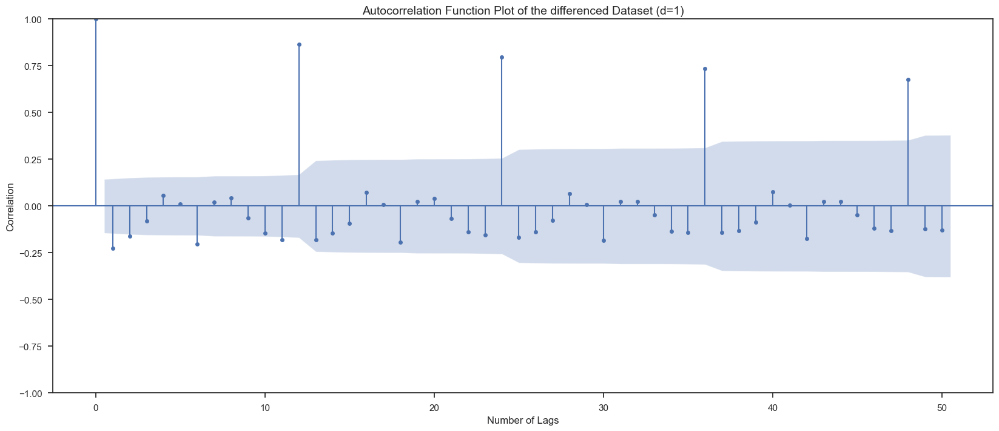

In [116]:
plot_acf(df.diff().dropna(),alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

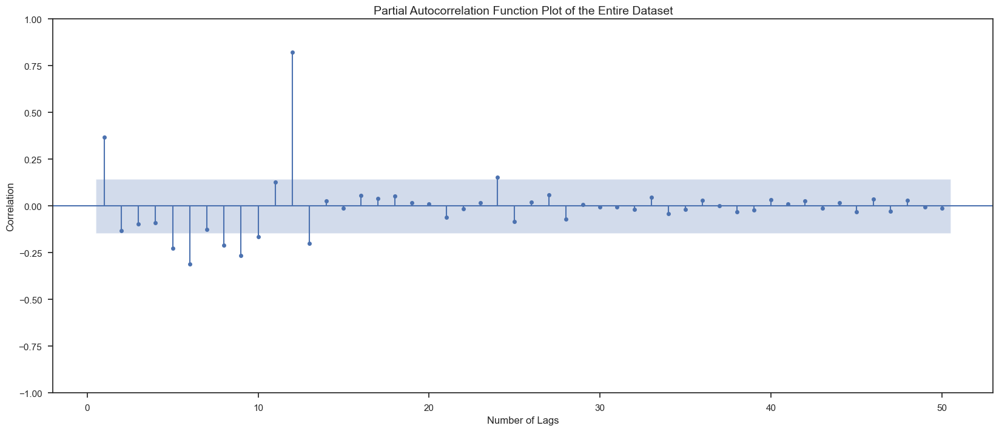

In [117]:
#PACF plot
plot_pacf(df,zero=False,alpha=0.05,lags=50, method='ywmle');
plt.title('Partial Autocorrelation Function Plot of the Entire Dataset', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

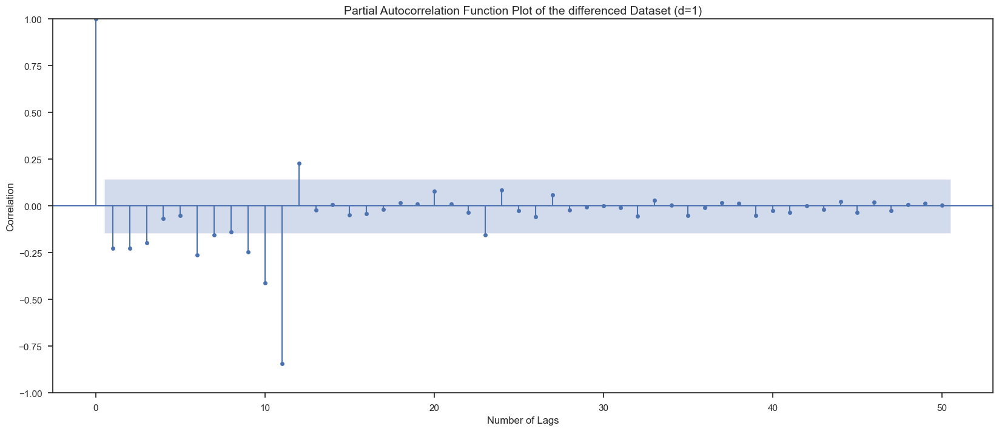

In [118]:
plot_pacf(df.diff().dropna(),alpha=0.05,lags=50,method='ywmle');
plt.title('Partial Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

In [119]:
print('First few rows of Training Data')
display(train.head())
print('Last few rows of Training Data')
display(train.tail())
print('First few rows of Test Data')
display(test.head())
print('Last few rows of Test Data')
display(test.tail())

First few rows of Training Data


,Sparkling_Wine_Sales
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


Last few rows of Training Data


,Sparkling_Wine_Sales
Time_Stamp,
1990-08-31,1605
1990-09-30,2424
1990-10-31,3116
1990-11-30,4286
1990-12-31,6047


First few rows of Test Data


,Sparkling_Wine_Sales
Time_Stamp,
1991-01-31,1902
1991-02-28,2049
1991-03-31,1874
1991-04-30,1279
1991-05-31,1432


Last few rows of Test Data


,Sparkling_Wine_Sales
Time_Stamp,
1995-03-31,1897
1995-04-30,1862
1995-05-31,1670
1995-06-30,1688
1995-07-31,2031


Text(0, 0.5, 'Wine units sold')

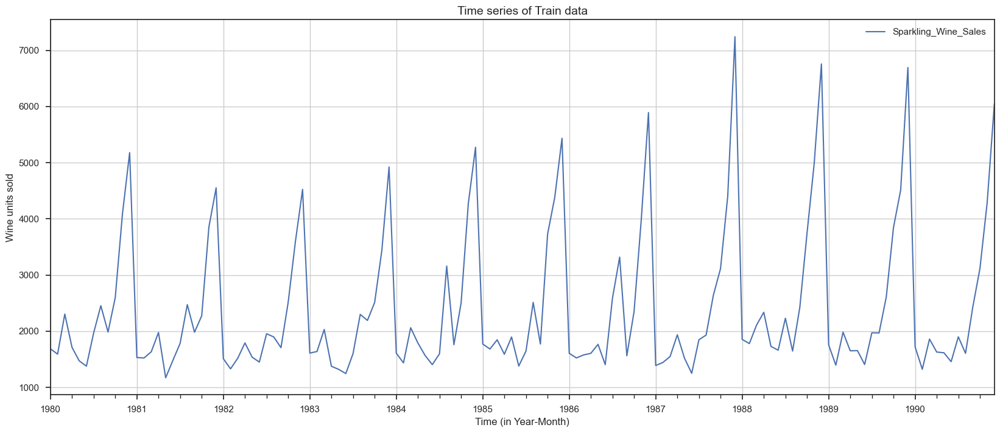

In [120]:
#Check for stationarity of the Training Data Time Series.
#Let us plot the training data once.

train.plot(grid=True);
plt.title('Time series of Train data', fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')

In [121]:
print('Results of Dicky-Fuller Test on Train data')
dftest = adfuller(train,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test on Train data
DF test statistic is -2.062
DF test p-value is 0.5674110388593717
Number of lags used 12


In [122]:
print('Results of Dicky-Fuller Test on Train data with differencing')
dftest = adfuller(train.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test on Train data with differencing
DF test statistic is -7.968
DF test p-value is 8.479210655514579e-11
Number of lags used 11


Text(0, 0.5, 'Wine units sold')

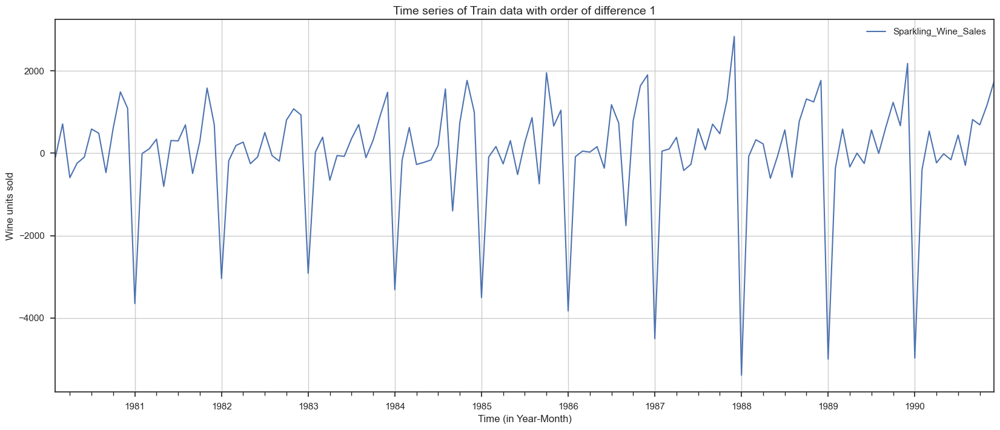

In [123]:
train.diff().dropna().plot(grid=True);
plt.title('Time series of Train data with order of difference 1', fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')

In [124]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132 entries, 1980-01-31 to 1990-12-31
Data columns (total 1 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Sparkling_Wine_Sales  132 non-null    int64
dtypes: int64(1)
memory usage: 2.1 KB


Text(0, 0.5, 'Correlation')

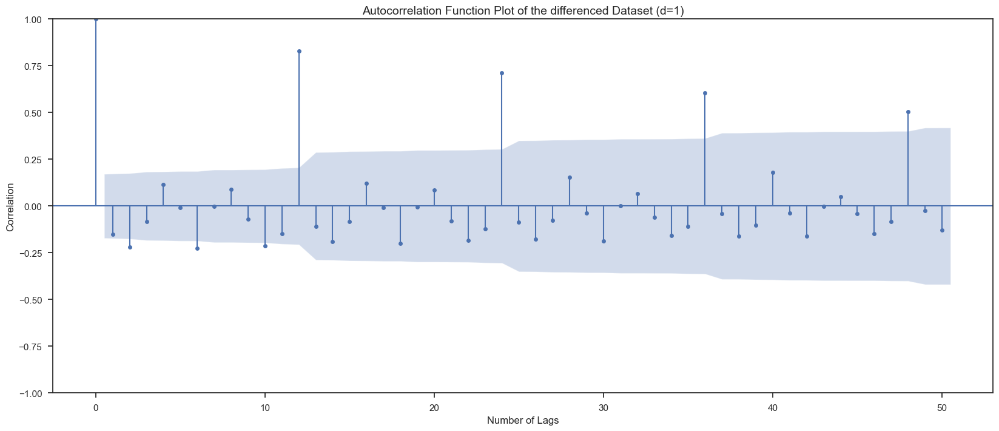

In [125]:
plot_acf(train.diff().dropna(),alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

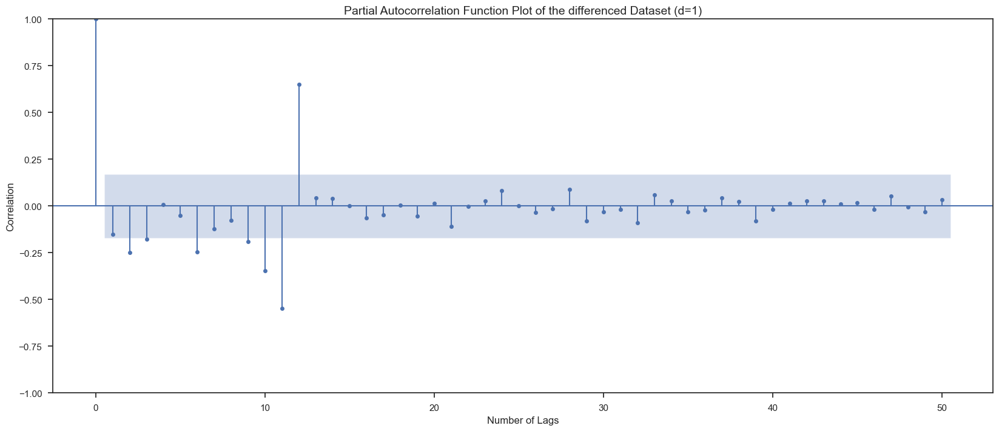

In [126]:
plot_pacf(train.diff().dropna(),alpha=0.05,lags=50,method='ywmle');
plt.title('Partial Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

In [127]:
#Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE.
#ARIMA Model
#The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 5
#We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 5)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Examples of the parameter combinations for the Model
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (0, 1, 4)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (1, 1, 4)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (2, 1, 4)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)
Model: (3, 1, 4)
Model: (4, 1, 0)
Model: (4, 1, 1)
Model: (4, 1, 2)
Model: (4, 1, 3)
Model: (4, 1, 4)


In [128]:
#Creating an empty Dataframe with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [129]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:# running a loop within the pdq parameters defined by itertools
    ARIMA_model = ARIMA(train['Sparkling_Wine_Sales'].values,order=param).fit()#fitting the ARIMA model
    #using the parameters from the loop
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))#printing the parameters and the AIC
    #from the fitted models
    ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
    #appending the AIC values and the model parameters to the previously created data frame
    #for easier understanding and sorting of the AIC values

ARIMA(0, 1, 0) - AIC:2267.6630357855465
ARIMA(0, 1, 1) - AIC:2263.060015591336
ARIMA(0, 1, 2) - AIC:2234.4083231280847
ARIMA(0, 1, 3) - AIC:2233.9948577515283
ARIMA(0, 1, 4) - AIC:2235.173736469055
ARIMA(1, 1, 0) - AIC:2266.6085393190087
ARIMA(1, 1, 1) - AIC:2235.7550946674446
ARIMA(1, 1, 2) - AIC:2234.527200451377
ARIMA(1, 1, 3) - AIC:2235.6078124045407
ARIMA(1, 1, 4) - AIC:2227.736977226125
ARIMA(2, 1, 0) - AIC:2260.36574396809
ARIMA(2, 1, 1) - AIC:2233.777626345568
ARIMA(2, 1, 2) - AIC:2213.5092126619975
ARIMA(2, 1, 3) - AIC:2232.8373775902896
ARIMA(2, 1, 4) - AIC:2222.921832416773
ARIMA(3, 1, 0) - AIC:2257.72337899794
ARIMA(3, 1, 1) - AIC:2235.4985356696543
ARIMA(3, 1, 2) - AIC:2230.813235277273
ARIMA(3, 1, 3) - AIC:2221.4601386617624
ARIMA(3, 1, 4) - AIC:2219.8125115781104
ARIMA(4, 1, 0) - AIC:2259.7418413992673
ARIMA(4, 1, 1) - AIC:2237.0730564151854
ARIMA(4, 1, 2) - AIC:2233.054150069557
ARIMA(4, 1, 3) - AIC:2222.9040979770107
ARIMA(4, 1, 4) - AIC:2214.15414571979


In [130]:
#Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
12,"(2, 1, 2)",2213.509213
24,"(4, 1, 4)",2214.154146
19,"(3, 1, 4)",2219.812512
18,"(3, 1, 3)",2221.460139
23,"(4, 1, 3)",2222.904098


In [131]:
auto_ARIMA = ARIMA(train, order=(4,1,4))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

                                SARIMAX Results                                 
Dep. Variable:     Sparkling_Wine_Sales   No. Observations:                  132
Model:                   ARIMA(4, 1, 4)   Log Likelihood               -1098.077
Date:                  Sun, 12 Jan 2025   AIC                           2214.154
Time:                          12:46:19   BIC                           2240.031
Sample:                      01-31-1980   HQIC                          2224.669
                           - 12-31-1990                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4777      0.148     -3.217      0.001      -0.769      -0.187
ar.L2         -0.4801      0.072     -6.650      0.000      -0.622      -0.339
ar.L3         -0.4777      0.127    

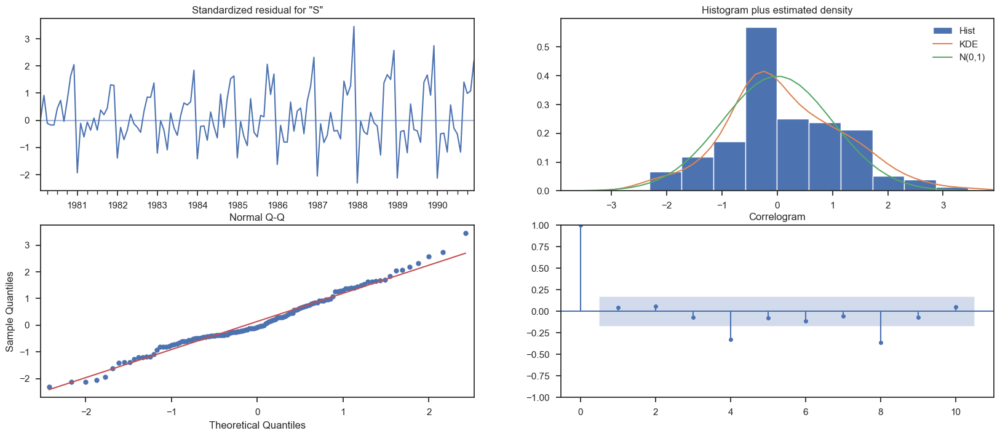

In [132]:
#Diagnostics plot
results_auto_ARIMA.plot_diagnostics();

In [133]:
#Predict on the Test Set using this model and evaluate the model.
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test))

In [134]:
predicted_auto_ARIMA

1991-01-31    3429.520560
1991-02-28    2705.266460
1991-03-31    3048.044009
1991-04-30    3354.269659
1991-05-31    2028.934651
1991-06-30    1974.810277
1991-07-31    2668.790416
1991-08-31    3155.578997
1991-09-30    1926.879225
1991-10-31    1920.450626
1991-11-30    2641.543124
1991-12-31    3140.170654
1992-01-31    1920.243046
1992-02-29    1915.779540
1992-03-31    2640.158683
1992-04-30    3138.235809
1992-05-31    1920.614067
1992-06-30    1914.764642
1992-07-31    2640.670079
1992-08-31    3137.295826
1992-09-30    1921.495253
1992-10-31    1914.023157
1992-11-30    2641.316096
1992-12-31    3136.433666
1993-01-31    1922.409190
1993-02-28    1913.306468
1993-03-31    2641.967342
1993-04-30    3135.581909
1993-05-31    1923.320827
1993-06-30    1912.596274
1993-07-31    2642.614336
1993-08-31    3134.735572
1993-09-30    1924.227617
1993-10-31    1911.891201
1993-11-30    2643.256413
1993-12-31    3133.894257
1994-01-31    1925.129404
1994-02-28    1911.191117
1994-03-31  

Text(0, 0.5, 'Wine Units Sold')

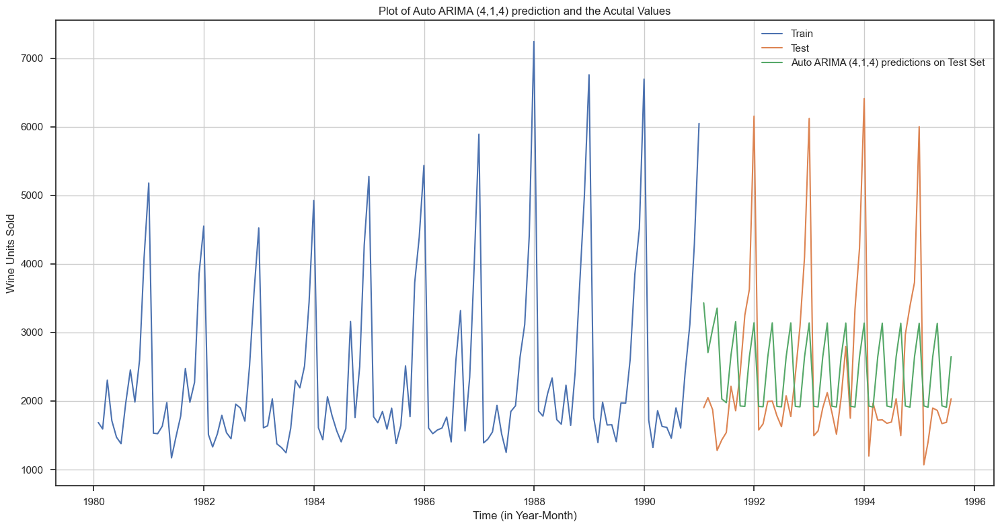

In [135]:
#Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_auto_ARIMA, label='Auto ARIMA (4,1,4) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Auto ARIMA (4,1,4) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [136]:
#Mean Absolute Percentage Error (MAPE) - Function Definition

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

#Importing the mean_squared_error function from sklearn to calculate the RMSE

from sklearn.metrics import mean_squared_error

In [137]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_auto_ARIMA,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_auto_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1209.1081222408832 
MAPE: 39.79982958562617


In [138]:
resultsDf_2 = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Auto ARIMA (4,1,4)'])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1209.108122,39.79983


Text(0, 0.5, 'Correlation')

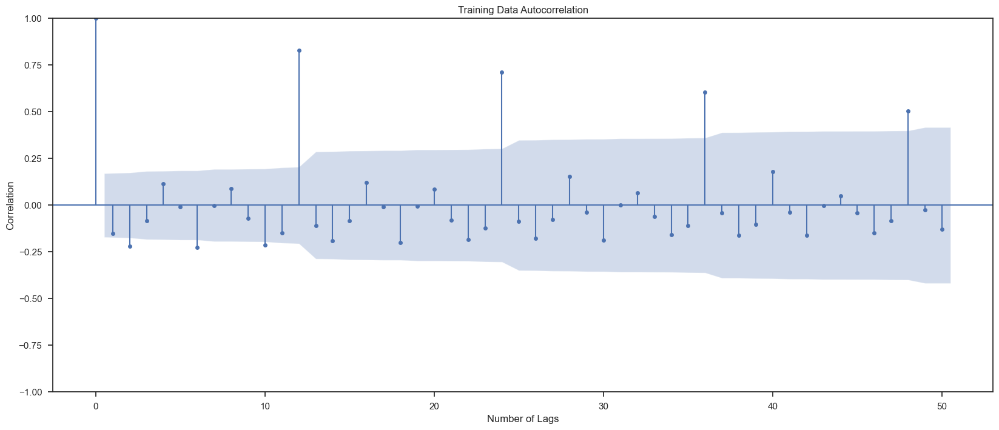

In [139]:
#SARIMA Model
#Let us look at the ACF plot once more to understand the seasonal parameter for the SARIMA model.

plot_acf(train.diff(),title='Training Data Autocorrelation',missing='drop',lags=50);
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

In [140]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(0,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 0)(0, 0, 0, 12)
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [141]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [142]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in PDQ:
        SARIMA_model = sm.tsa.statespace.SARIMAX(train['Sparkling_Wine_Sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))
        SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:2251.3597196862966
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1956.2614616843723
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:1723.1533640240011
SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:3403.6984002705353
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1837.4366022456675
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1806.9905301390047
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:1633.2108735791815
SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:3374.6849813783556
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:1648.3776153470858
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:1647.2054158611384
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:1630.9898053920742
SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:3516.420273392822
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:1467.4574095308406
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:1469.1871052625606
SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:1471.0594530065582
SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:2897.543744189881
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:2230.162907850584
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1923.7688649566576
SARIMA(0, 1, 

In [143]:
SARIMA_AIC.sort_values(by=['AIC']).head(20)

,param,seasonal,AIC
87,"(1, 1, 1)","(1, 0, 3, 12)",14.000000
119,"(1, 1, 3)","(1, 0, 3, 12)",18.000000
220,"(3, 1, 1)","(3, 0, 0, 12)",1387.788331
237,"(3, 1, 2)","(3, 0, 1, 12)",1388.602193
221,"(3, 1, 1)","(3, 0, 1, 12)",1388.681484
252,"(3, 1, 3)","(3, 0, 0, 12)",1389.142089
222,"(3, 1, 1)","(3, 0, 2, 12)",1389.195906
238,"(3, 1, 2)","(3, 0, 2, 12)",1389.702022
254,"(3, 1, 3)","(3, 0, 2, 12)",1391.692601
253,"(3, 1, 3)","(3, 0, 1, 12)",1393.169859


In [144]:
#The model is throwing errors with values before (3,1,2)(3,0,1,12). It is therefore due to this reason, we have decided on this parameter combination.
SARIMA_AIC.sort_values(by=['AIC']).iloc[12:,:]

,param,seasonal,AIC
206,"(3, 1, 0)","(3, 0, 2, 12)",1398.307466
188,"(2, 1, 3)","(3, 0, 0, 12)",1399.789820
189,"(2, 1, 3)","(3, 0, 1, 12)",1400.129197
172,"(2, 1, 2)","(3, 0, 0, 12)",1401.437617
236,"(3, 1, 2)","(3, 0, 0, 12)",1401.776085
...,...,...,...
135,"(2, 1, 0)","(1, 0, 3, 12)",4225.848514
35,"(0, 1, 2)","(0, 0, 3, 12)",4260.563962
99,"(1, 1, 2)","(0, 0, 3, 12)",4511.560369
131,"(2, 1, 0)","(0, 0, 3, 12)",4626.699387


In [145]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(train['Sparkling_Wine_Sales'],
                                order=(3, 1, 2),
                                seasonal_order=(3, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

                                      SARIMAX Results                                       
Dep. Variable:                 Sparkling_Wine_Sales   No. Observations:                  132
Model:             SARIMAX(3, 1, 2)x(3, 0, [1], 12)   Log Likelihood                -684.301
Date:                              Sun, 12 Jan 2025   AIC                           1388.602
Time:                                      12:58:04   BIC                           1413.820
Sample:                                  01-31-1980   HQIC                          1398.780
                                       - 12-31-1990                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5430      0.416     -1.306      0.191      -1.358       0.272
ar.L2         -0.00

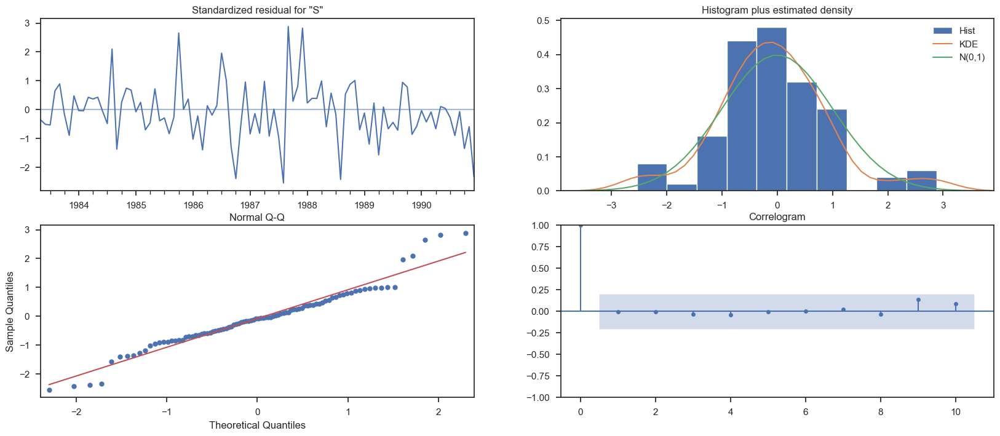

In [146]:
results_auto_SARIMA.plot_diagnostics();
plt.show()

In [147]:
#Predict on the Test Set using this model and evaluate the model.
predicted_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(test))

In [148]:
predicted_auto_SARIMA.predicted_mean

1991-01-31    1320.439102
1991-02-28    1298.740017
1991-03-31    1604.704532
1991-04-30    1626.321780
1991-05-31    1398.249861
1991-06-30    1238.032532
1991-07-31    1786.170631
1991-08-31    1510.556662
1991-09-30    2286.257818
1991-10-31    3291.150588
1991-11-30    4452.206100
1991-12-31    6491.517559
1992-01-31    1296.278999
1992-02-29    1102.200528
1992-03-31    1546.896701
1992-04-30    1444.210765
1992-05-31    1283.415837
1992-06-30    1095.334764
1992-07-31    1662.717060
1992-08-31    1420.130652
1992-09-30    2215.134755
1992-10-31    3278.176990
1992-11-30    4412.080532
1992-12-31    6549.209170
1993-01-31    1180.902556
1993-02-28     959.633084
1993-03-31    1428.196130
1993-04-30    1311.227949
1993-05-31    1161.017994
1993-06-30     971.752034
1993-07-31    1543.667168
1993-08-31    1276.120899
1993-09-30    2113.529669
1993-10-31    3158.646654
1993-11-30    4359.325310
1993-12-31    6527.722533
1994-01-31    1019.498198
1994-02-28     825.182289
1994-03-31  

Text(0, 0.5, 'Wine Units Sold')

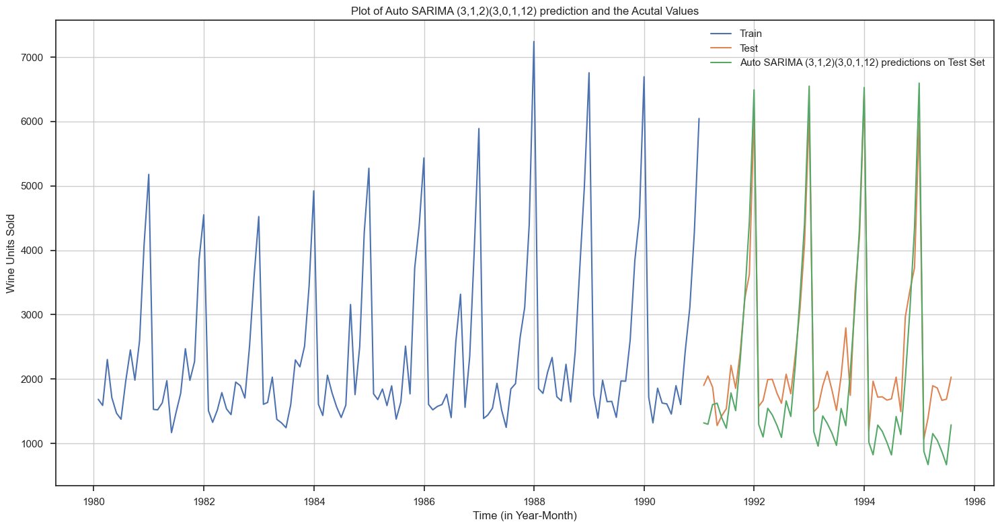

In [149]:
#Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_auto_SARIMA.predicted_mean, label='Auto SARIMA (3,1,2)(3,0,1,12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Auto SARIMA (3,1,2)(3,0,1,12) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [150]:
predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

Sparkling_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-31,1320.439102,407.839127,521.089102,2119.789103
1991-02-28,1298.740017,421.139373,473.322013,2124.158020
1991-03-31,1604.704532,421.139768,779.285755,2430.123308
1991-04-30,1626.321780,429.638872,784.245066,2468.398495
1991-05-31,1398.249861,430.103573,555.262347,2241.237374


In [151]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_auto_SARIMA.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_auto_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 579.5148032167747 
MAPE: 25.030078977210323


In [152]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Auto SARIMA (3,1,2)(3,0,1,12)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1209.108122,39.799830
"Auto SARIMA (3,1,2)(3,0,1,12)",579.514803,25.030079


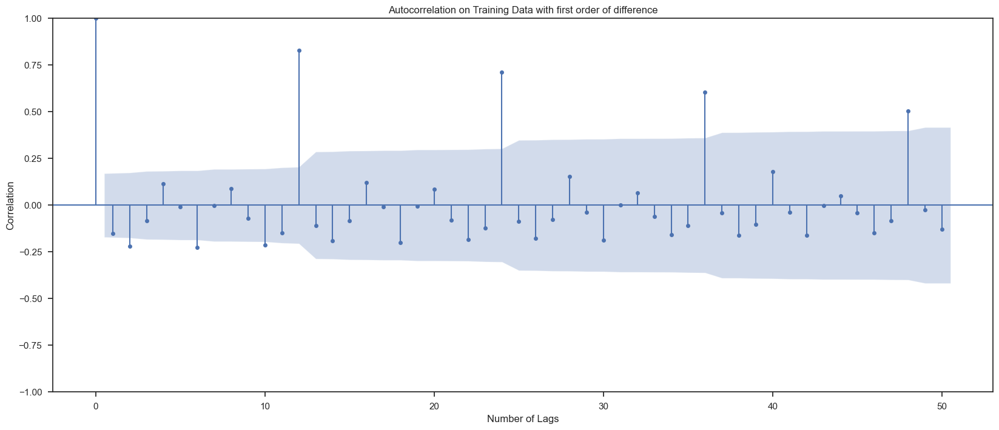

In [153]:
#Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.
#ACF plot
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

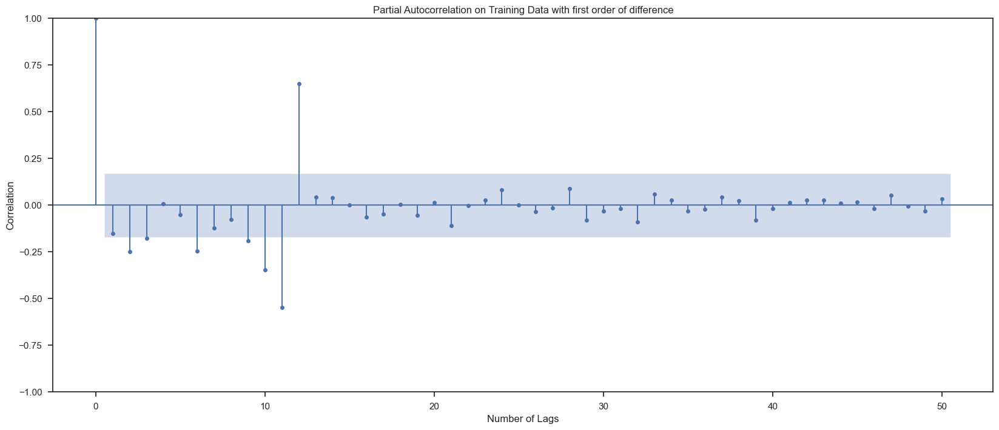

In [154]:
#PACF plot
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

In [155]:
manual_ARIMA = ARIMA(train['Sparkling_Wine_Sales'], order=(0,1,0),freq='M')

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                                SARIMAX Results                                 
Dep. Variable:     Sparkling_Wine_Sales   No. Observations:                  132
Model:                   ARIMA(0, 1, 0)   Log Likelihood               -1132.832
Date:                  Sun, 12 Jan 2025   AIC                           2267.663
Time:                          12:58:06   BIC                           2270.538
Sample:                      01-31-1980   HQIC                          2268.831
                           - 12-31-1990                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.885e+06   1.29e+05     14.658      0.000    1.63e+06    2.14e+06
Ljung-Box (L1) (Q):                   3.07   Jarque-Bera (JB):               198.83
Prob(Q):                       

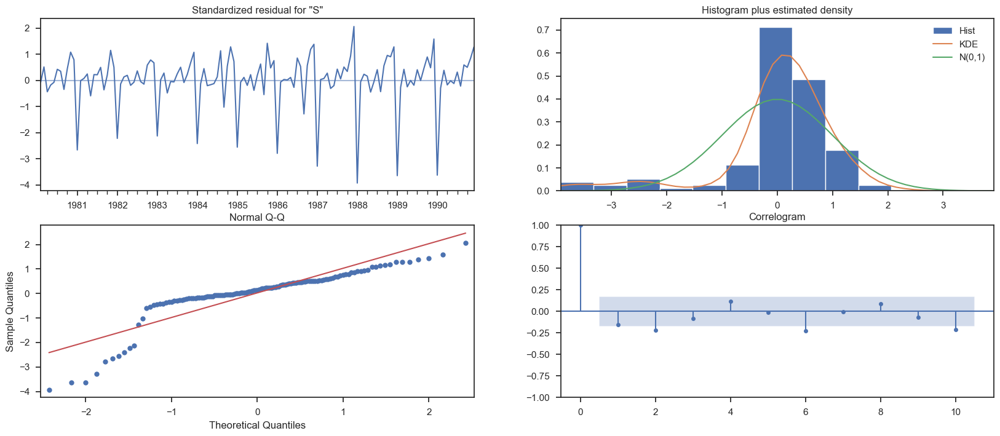

In [156]:
results_manual_ARIMA.plot_diagnostics();

In [157]:
#Predict on the Test Set using this model and evaluate the model.
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

In [158]:
predicted_manual_ARIMA

1991-01-31    6047.0
1991-02-28    6047.0
1991-03-31    6047.0
1991-04-30    6047.0
1991-05-31    6047.0
1991-06-30    6047.0
1991-07-31    6047.0
1991-08-31    6047.0
1991-09-30    6047.0
1991-10-31    6047.0
1991-11-30    6047.0
1991-12-31    6047.0
1992-01-31    6047.0
1992-02-29    6047.0
1992-03-31    6047.0
1992-04-30    6047.0
1992-05-31    6047.0
1992-06-30    6047.0
1992-07-31    6047.0
1992-08-31    6047.0
1992-09-30    6047.0
1992-10-31    6047.0
1992-11-30    6047.0
1992-12-31    6047.0
1993-01-31    6047.0
1993-02-28    6047.0
1993-03-31    6047.0
1993-04-30    6047.0
1993-05-31    6047.0
1993-06-30    6047.0
1993-07-31    6047.0
1993-08-31    6047.0
1993-09-30    6047.0
1993-10-31    6047.0
1993-11-30    6047.0
1993-12-31    6047.0
1994-01-31    6047.0
1994-02-28    6047.0
1994-03-31    6047.0
1994-04-30    6047.0
1994-05-31    6047.0
1994-06-30    6047.0
1994-07-31    6047.0
1994-08-31    6047.0
1994-09-30    6047.0
1994-10-31    6047.0
1994-11-30    6047.0
1994-12-31   

Text(0, 0.5, 'Wine Units Sold')

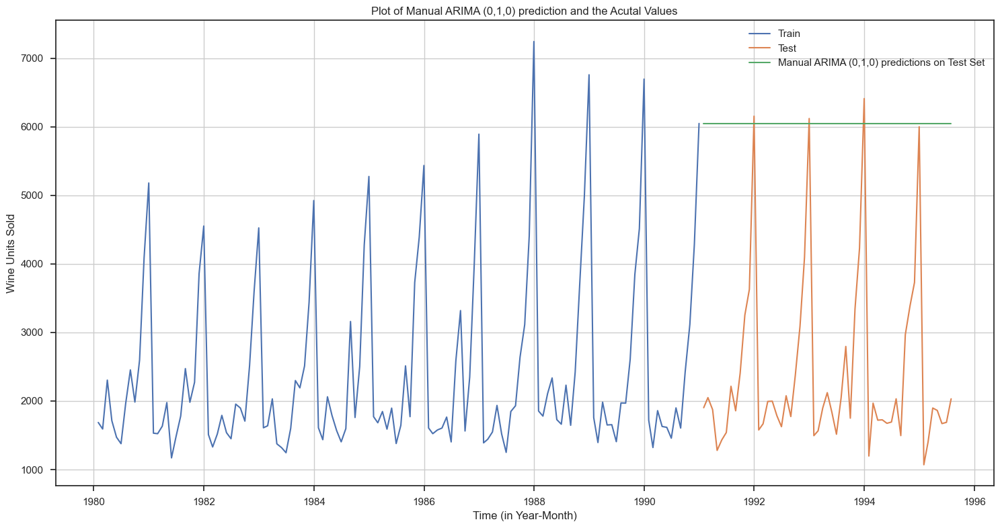

In [159]:
#Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (0,1,0) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual ARIMA (0,1,0) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [160]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_manual_ARIMA,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 3864.2793518443914 
MAPE: 201.3276495035274


In [161]:
manual_ARIMA = ARIMA(train['Sparkling_Wine_Sales'], order=(2,1,1),freq='M')

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                                SARIMAX Results                                 
Dep. Variable:     Sparkling_Wine_Sales   No. Observations:                  132
Model:                   ARIMA(2, 1, 1)   Log Likelihood               -1112.889
Date:                  Sun, 12 Jan 2025   AIC                           2233.778
Time:                          12:58:07   BIC                           2245.278
Sample:                      01-31-1980   HQIC                          2238.451
                           - 12-31-1990                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5194      0.119      4.359      0.000       0.286       0.753
ar.L2         -0.1782      0.196     -0.908      0.364      -0.563       0.206
ma.L1         -0.9993      0.667    

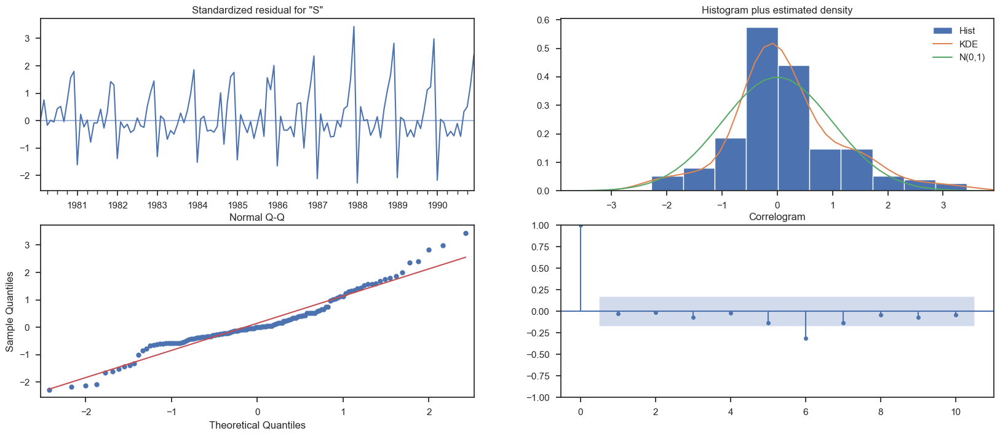

In [162]:
results_manual_ARIMA.plot_diagnostics();

In [163]:
#Predict on the Test Set using this model and evaluate the model.
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

In [164]:
predicted_manual_ARIMA

1991-01-31    3957.667371
1991-02-28    2558.511621
1991-03-31    2204.093599
1991-04-30    2269.356383
1991-05-31    2366.423268
1991-06-30    2405.213069
1991-07-31    2408.062620
1991-08-31    2402.629496
1991-09-30    2399.299405
1991-10-31    2398.537913
1991-11-30    2398.735863
1991-12-31    2398.974405
1992-01-31    2399.063036
1992-02-29    2399.066560
1992-03-31    2399.052595
1992-04-30    2399.044713
1992-05-31    2399.043107
1992-06-30    2399.043678
1992-07-31    2399.044261
1992-08-31    2399.044462
1992-09-30    2399.044462
1992-10-31    2399.044427
1992-11-30    2399.044408
1992-12-31    2399.044405
1993-01-31    2399.044406
1993-02-28    2399.044408
1993-03-31    2399.044408
1993-04-30    2399.044408
1993-05-31    2399.044408
1993-06-30    2399.044408
1993-07-31    2399.044408
1993-08-31    2399.044408
1993-09-30    2399.044408
1993-10-31    2399.044408
1993-11-30    2399.044408
1993-12-31    2399.044408
1994-01-31    2399.044408
1994-02-28    2399.044408
1994-03-31  

Text(0, 0.5, 'Wine Units Sold')

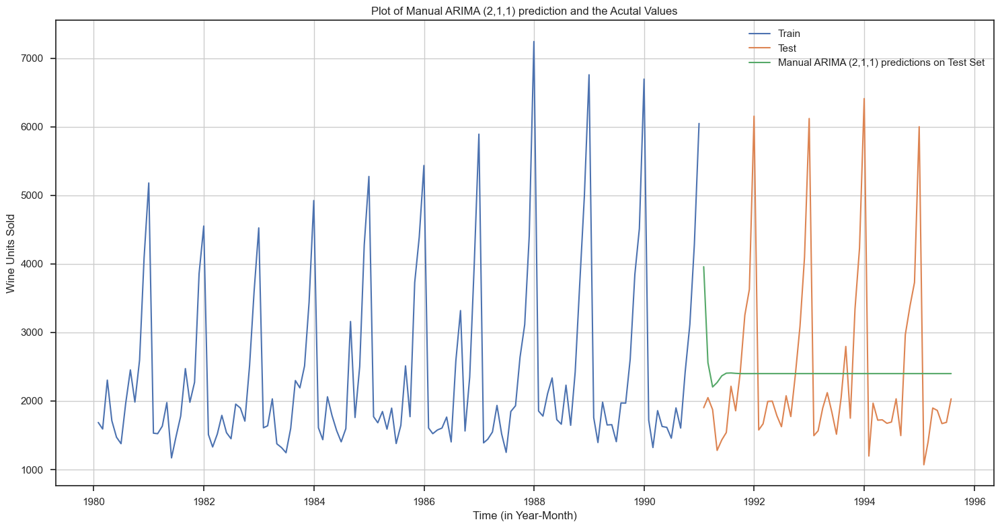

In [165]:
#Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (2,1,1) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual ARIMA (2,1,1) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [166]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_manual_ARIMA,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1300.7213875940786 
MAPE: 40.225668513366756


In [167]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Manual ARIMA (2,1,1)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1209.108122,39.799830
"Auto SARIMA (3,1,2)(3,0,1,12)",579.514803,25.030079
"Manual ARIMA (2,1,1)",1300.721388,40.225669


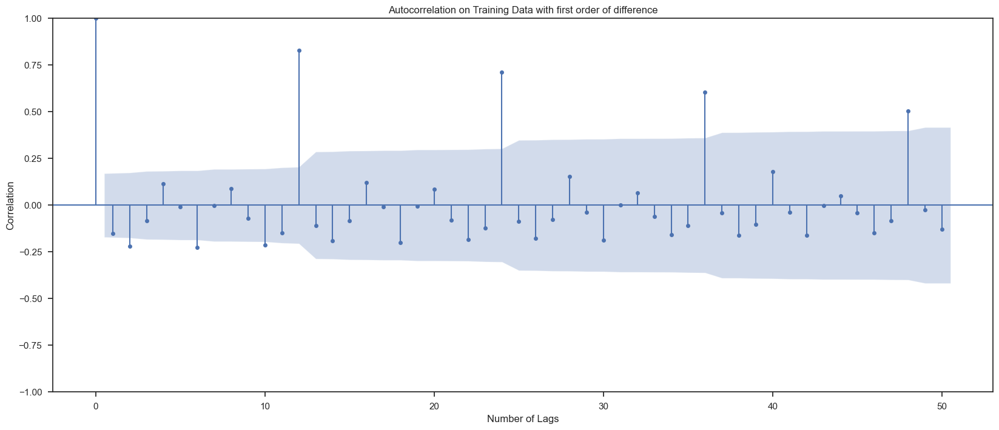

In [168]:
#Manual SARIMA Model
#ACF plot
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

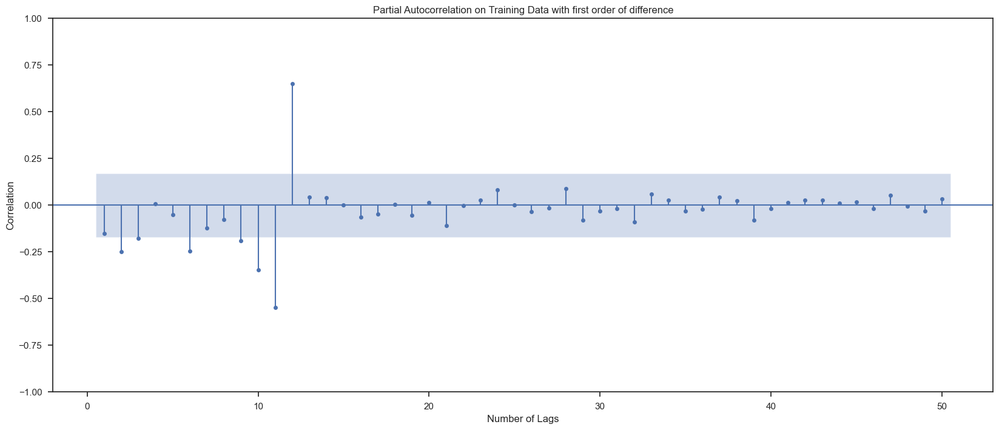

In [169]:
#PACF plot
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,zero=False,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

Text(0, 0.5, 'Units Sold')

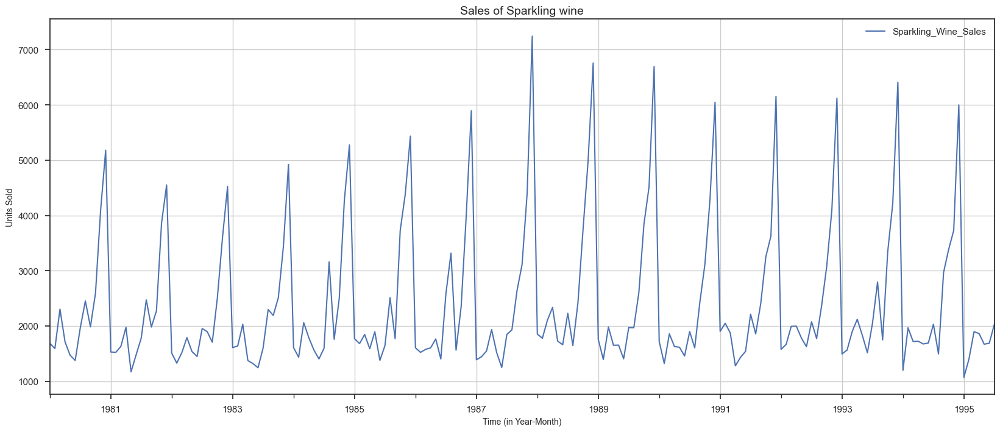

In [170]:
#Original Time Series
rcParams['figure.figsize'] = 20,8
df.plot(grid=True);
plt.title('Sales of Sparkling wine', fontsize=14)
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Units Sold',fontsize=10)

Text(0, 0.5, 'Wine Units Sold')

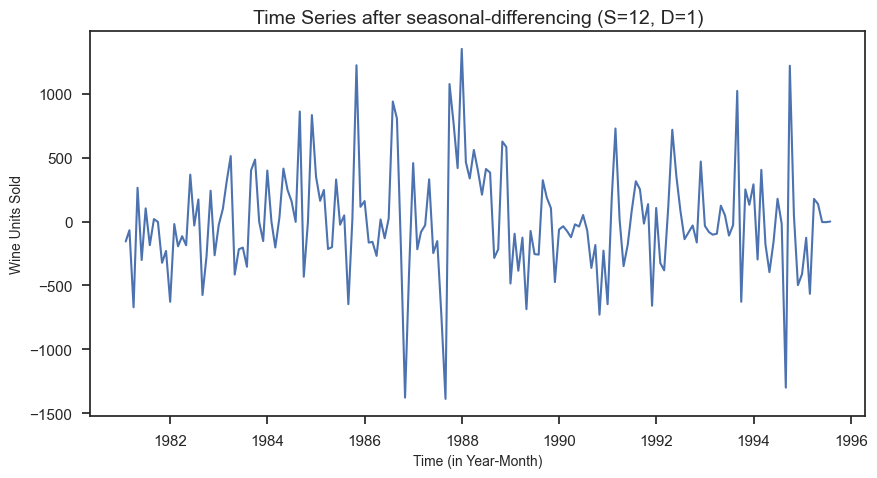

In [171]:
#Time series with seasonal differencing (S=12, D=1)
plt.figure(figsize=(10,5))
plt.plot(df['Sparkling_Wine_Sales'].diff(12).dropna())
plt.title ('Time Series after seasonal-differencing (S=12, D=1)',fontsize=14);
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

Text(0, 0.5, 'Wine Units Sold')

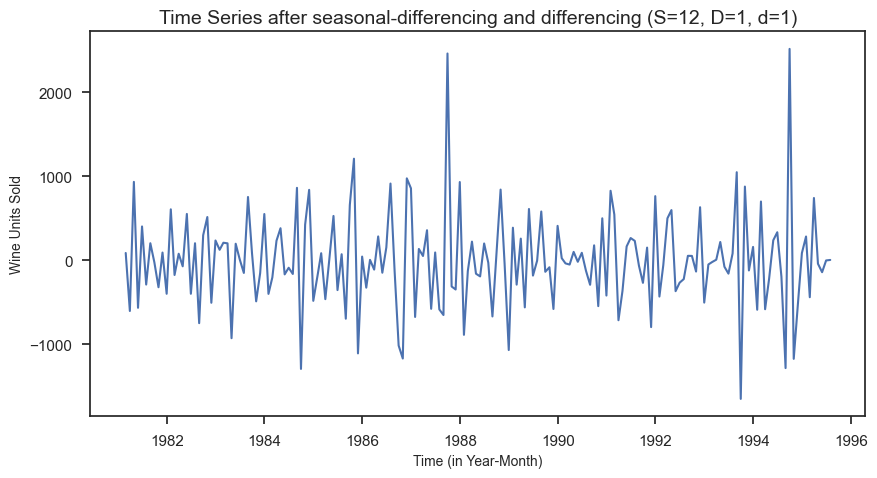

In [172]:
#Time series with seasonal differencing followed by normal differencing (S=12, D=1, d=1)
plt.figure(figsize=(10,5))
plt.plot((df['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna())
plt.title ('Time Series after seasonal-differencing and differencing (S=12, D=1, d=1)',fontsize=14);
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

In [173]:
#Testing stationarity
dftest = adfuller((df['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -5.121
DF test p-value is 0.00012316304915680515
Number of lags used 11


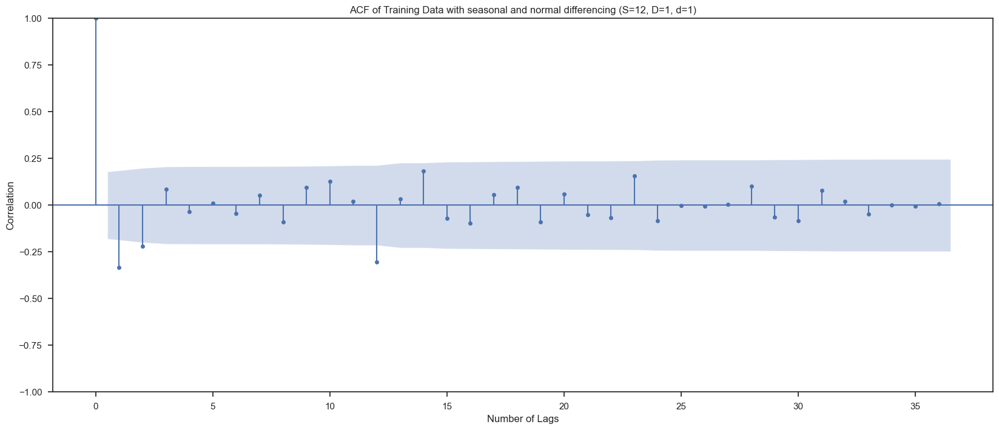

In [174]:
plot_acf((train['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='ACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=36)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

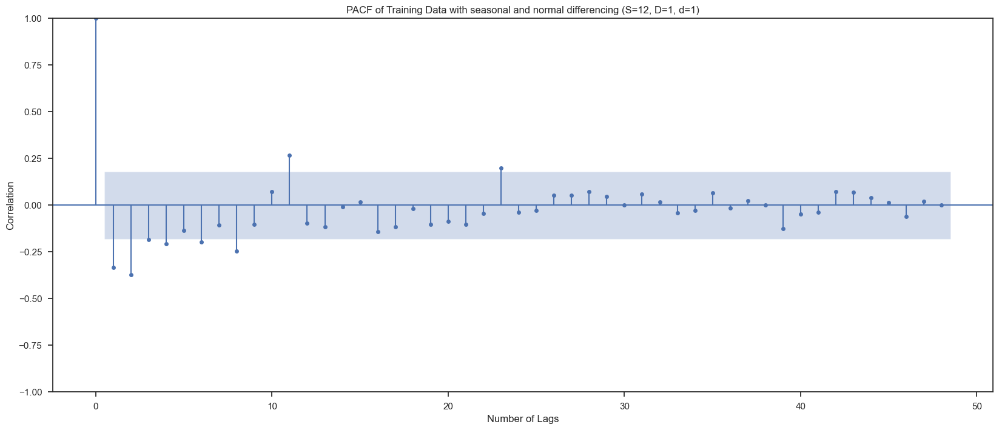

In [175]:
plot_pacf((train['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='PACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=48)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

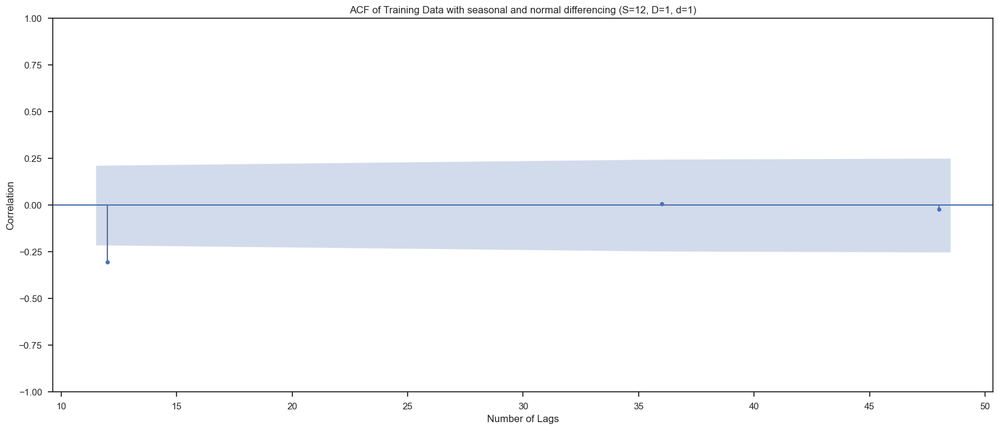

In [176]:
plot_acf((train['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='ACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=[12.24,36,48])
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

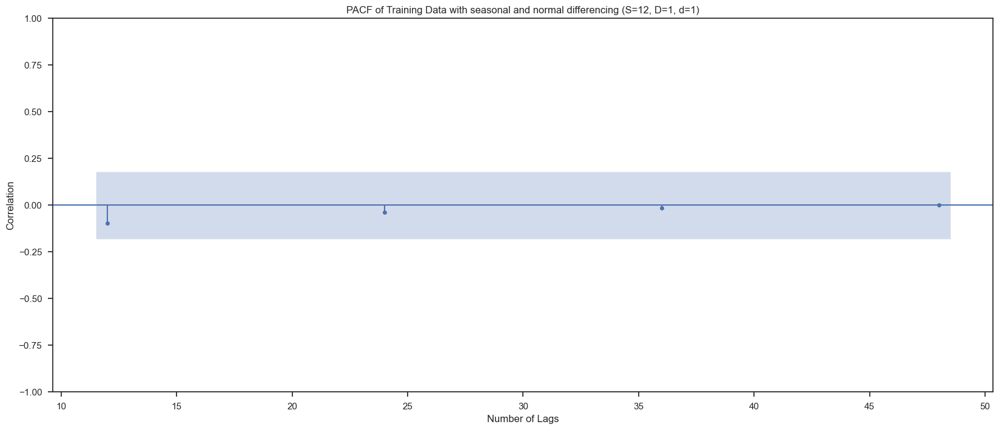

In [177]:
plot_pacf((train['Sparkling_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='PACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=[12,24,36,48])
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

In [178]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(train['Sparkling_Wine_Sales'],
                                order=(4,1,2),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA.summary())

                                      SARIMAX Results                                       
Dep. Variable:                 Sparkling_Wine_Sales   No. Observations:                  132
Model:             SARIMAX(4, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -771.377
Date:                              Sun, 12 Jan 2025   AIC                           1558.755
Time:                                      12:58:13   BIC                           1579.910
Sample:                                  01-31-1980   HQIC                          1567.325
                                       - 12-31-1990                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1794      0.593     -0.303      0.762      -1.341       0.982
ar.L2         -0.08

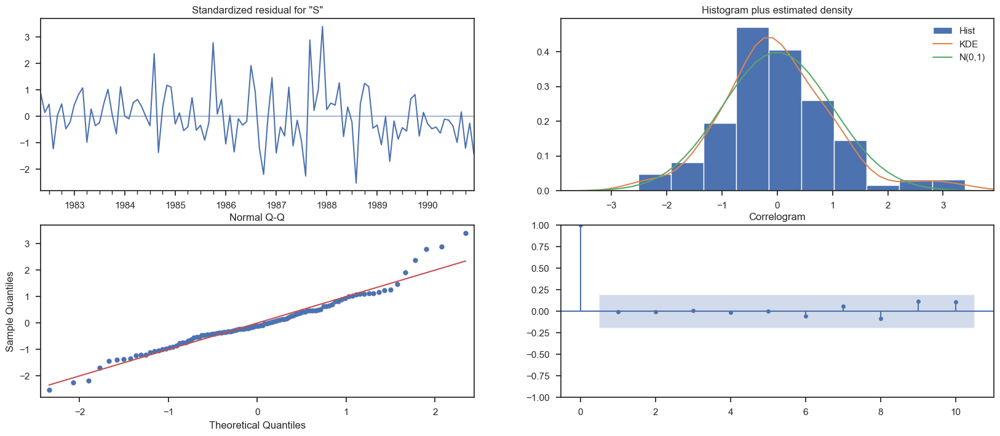

In [179]:
results_manual_SARIMA.plot_diagnostics()
plt.show()

In [180]:
#Predict on the Test Set using this model and evaluate the model.
predicted_manual_SARIMA = results_manual_SARIMA.get_forecast(steps=len(test))

In [181]:
predicted_manual_SARIMA.predicted_mean

1991-01-31    1431.533152
1991-02-28    1348.288263
1991-03-31    1722.381485
1991-04-30    1621.897800
1991-05-31    1476.372111
1991-06-30    1255.611556
1991-07-31    1798.112799
1991-08-31    1612.943053
1991-09-30    2267.723566
1991-10-31    3183.852968
1991-11-30    4248.331828
1991-12-31    6166.345229
1992-01-31    1398.918569
1992-02-29    1206.059547
1992-03-31    1632.939923
1992-04-30    1503.837882
1992-05-31    1381.732729
1992-06-30    1178.104221
1992-07-31    1706.376811
1992-08-31    1527.412714
1992-09-30    2178.785262
1992-10-31    3091.932532
1992-11-30    4159.677503
1992-12-31    6076.281540
1993-01-31    1309.330601
1993-02-28    1117.054528
1993-03-31    1543.229819
1993-04-30    1414.443753
1993-05-31    1292.275144
1993-06-30    1088.522690
1993-07-31    1616.944026
1993-08-31    1437.910994
1993-09-30    2089.291288
1993-10-31    3002.466071
1993-11-30    4070.179855
1993-12-31    5986.798551
1994-01-31    1219.846887
1994-02-28    1027.564618
1994-03-31  

Text(0, 0.5, 'Wine Units Sold')

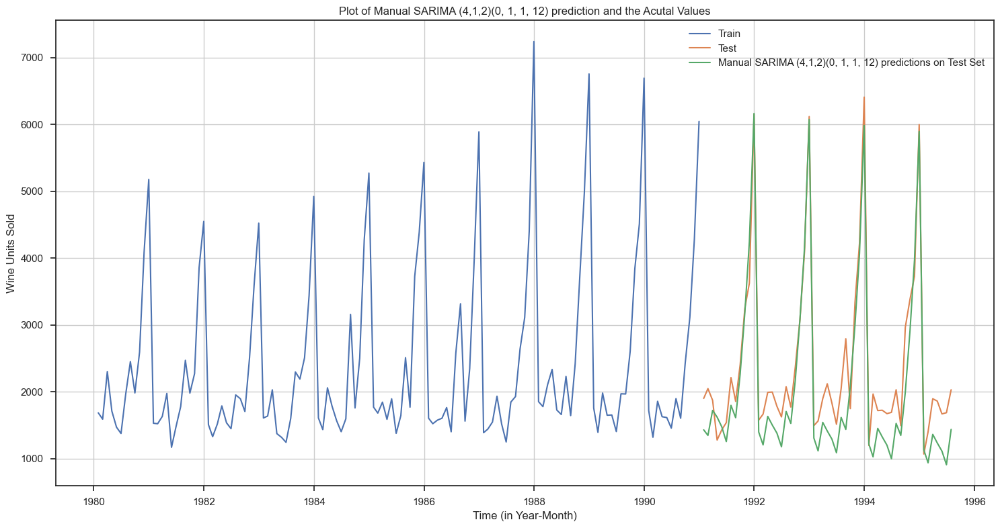

In [182]:
#Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual SARIMA (4,1,2)(0, 1, 1, 12) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [183]:
rmse = mean_squared_error(test['Sparkling_Wine_Sales'],predicted_manual_SARIMA.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling_Wine_Sales'],predicted_manual_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 468.67747539534855 
MAPE: 19.324909984116758


In [184]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Manual SARIMA (4, 1, 2)(0, 1, 1, 12)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1209.108122,39.799830
"Auto SARIMA (3,1,2)(3,0,1,12)",579.514803,25.030079
"Manual ARIMA (2,1,1)",1300.721388,40.225669
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",468.677475,19.324910


In [185]:
#Build a table (create a data frame) with all the models built along with their corresponding parameters and the respective RMSE values on the test data.
#Combining the tables which contained the exponential smoothing models and ARIMA/SARIMA into one
resultsDf_Final = pd.concat([resultsDf,resultsDf_2])

resultsDf_Final

,Test RMSE,MAPE
Linear Regression,1389.135175,NaN
Naive Model,3864.279352,NaN
Simple Average,1275.081804,NaN
2 point TMA,813.400684,NaN
4 point TMA,1156.589694,NaN
6 point TMA,1283.927428,NaN
9 point TMA,1346.278315,NaN
"Alpha =0.0496,SimpleExponentialSmoothing",1304.927405,NaN
"Alpha=0.6885, Beta=9.99e-05, Double Exponential Smoothing",2007.238526,NaN
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1418.407668,NaN


In [186]:
resultsDf_Final.sort_values(by='MAPE',ascending=True)

,Test RMSE,MAPE
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",468.677475,19.324910
"Auto SARIMA (3,1,2)(3,0,1,12)",579.514803,25.030079
"Auto ARIMA (4,1,4)",1209.108122,39.799830
"Manual ARIMA (2,1,1)",1300.721388,40.225669
Linear Regression,1389.135175,NaN
Naive Model,3864.279352,NaN
Simple Average,1275.081804,NaN
2 point TMA,813.400684,NaN
4 point TMA,1156.589694,NaN
6 point TMA,1283.927428,NaN


In [187]:
resultsDf_Final.sort_values(by='Test RMSE',ascending=True)

,Test RMSE,MAPE
"Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing",331.037724,NaN
"Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing",403.706228,NaN
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",468.677475,19.324910
"Auto SARIMA (3,1,2)(3,0,1,12)",579.514803,25.030079
2 point TMA,813.400684,NaN
4 point TMA,1156.589694,NaN
"Auto ARIMA (4,1,4)",1209.108122,39.799830
Simple Average,1275.081804,NaN
6 point TMA,1283.927428,NaN
"Manual ARIMA (2,1,1)",1300.721388,40.225669


Text(0, 0.5, 'Wine Units Sold')

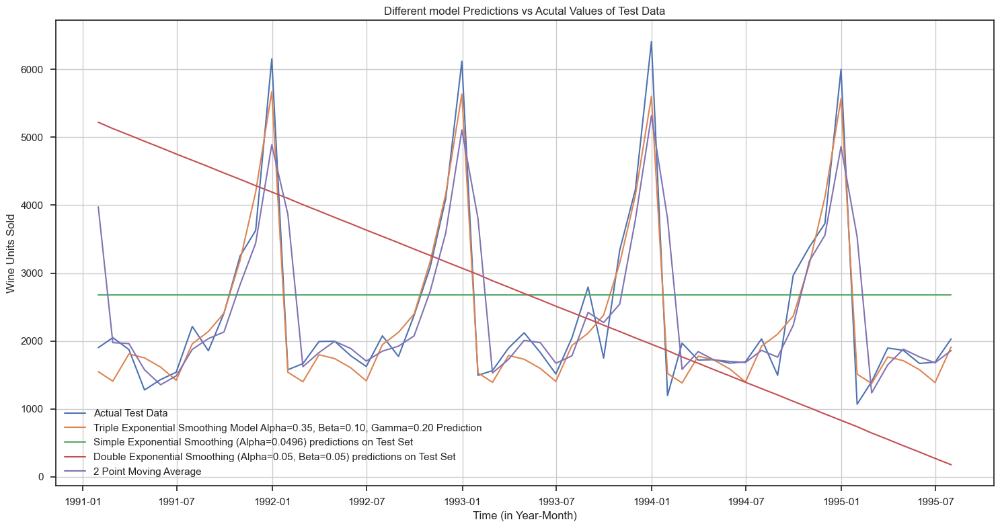

In [188]:
#Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.
#Plotting on training data

plt.figure(figsize=(18,9))
plt.plot(test['Sparkling_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Triple Exponential Smoothing Model Alpha=0.35, Beta=0.10, Gamma=0.20 Prediction')

plt.plot(SES_test['predict'], label='Simple Exponential Smoothing (Alpha=0.0496) predictions on Test Set')

plt.plot(DES_test['predict'], label='Double Exponential Smoothing (Alpha=0.05, Beta=0.05) predictions on Test Set')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Moving Average')

plt.legend(loc='best')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

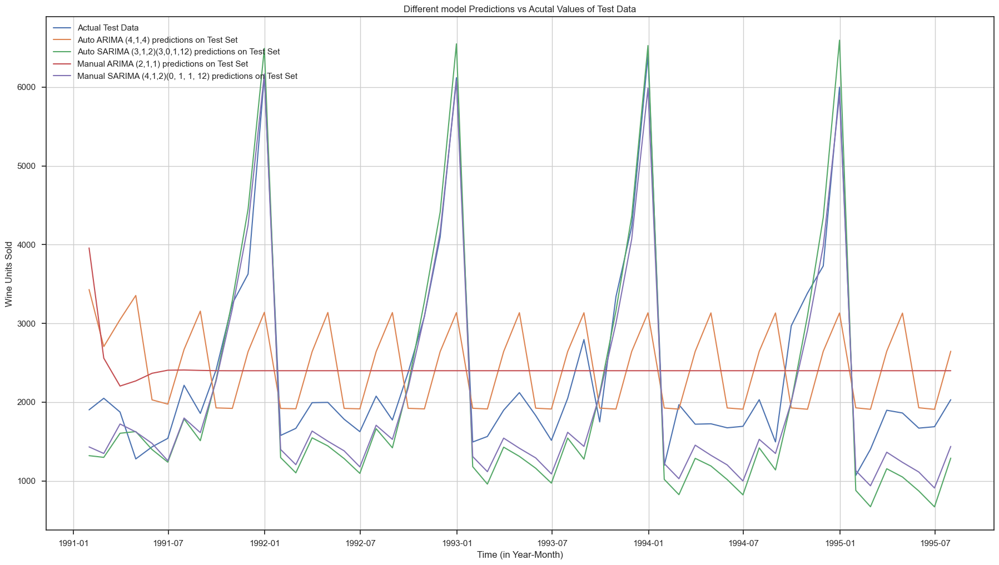

In [189]:
#Plotting on both the Training data

plt.figure(figsize=(22,12))
plt.plot(test['Sparkling_Wine_Sales'], label='Actual Test Data')

plt.plot(predicted_auto_ARIMA, label='Auto ARIMA (4,1,4) predictions on Test Set')

plt.plot(predicted_auto_SARIMA.predicted_mean, label='Auto SARIMA (3,1,2)(3,0,1,12) predictions on Test Set')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (2,1,1) predictions on Test Set')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')


plt.legend(loc='upper left')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

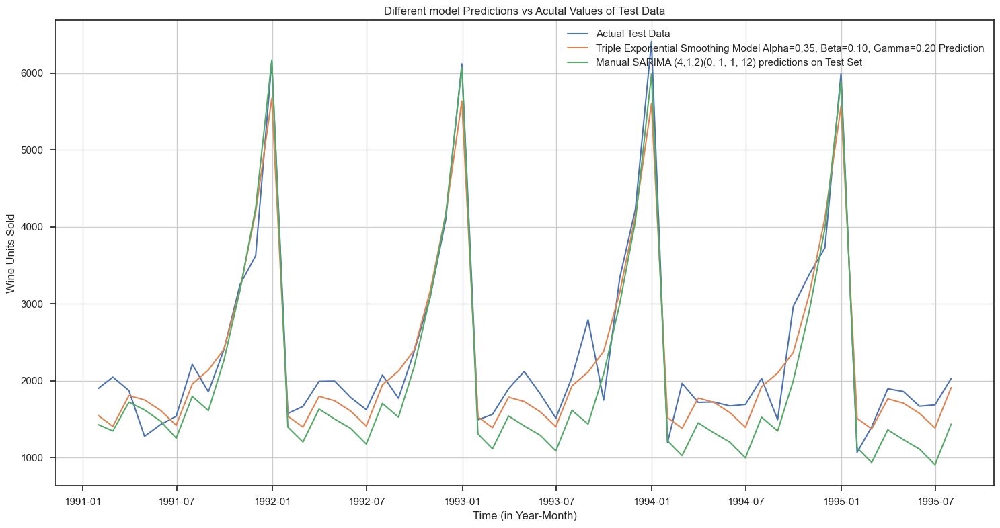

In [190]:
#Plotting on both the Training data

plt.figure(figsize=(18,9))
plt.plot(test['Sparkling_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Triple Exponential Smoothing Model Alpha=0.35, Beta=0.10, Gamma=0.20 Prediction')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

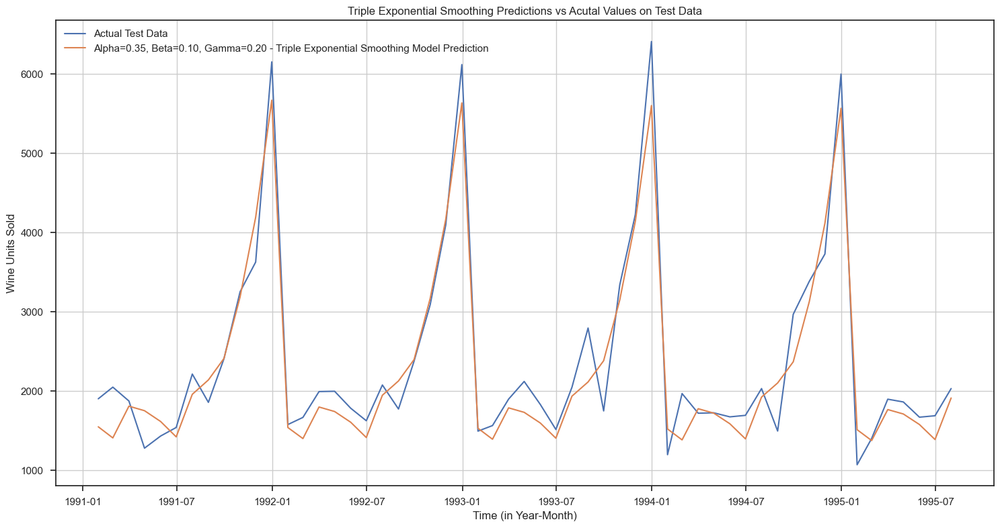

In [191]:
#Optimum Model - Triple Exponential Smoothing Model (Alpha=0.35,Beta=0.10,Gamma=0.20)
#Plotting on both the Training data

plt.figure(figsize=(18,9))
plt.plot(test['Sparkling_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35, Beta=0.10, Gamma=0.20 - Triple Exponential Smoothing Model Prediction')

plt.legend(loc='best')
plt.grid();
plt.title('Triple Exponential Smoothing Predictions vs Acutal Values on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

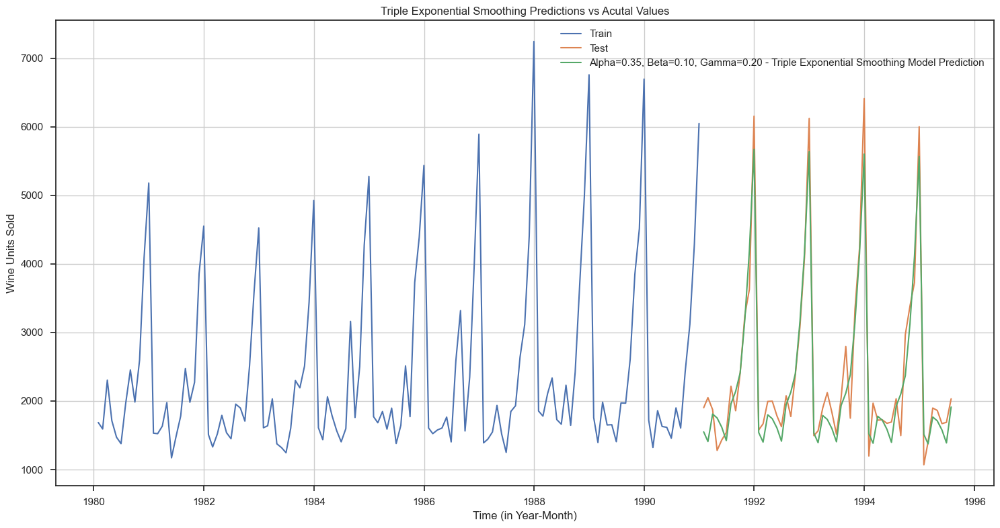

In [192]:
#Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(TES_test['predict', 0.35,0.10,0.20], label='Alpha=0.35, Beta=0.10, Gamma=0.20 - Triple Exponential Smoothing Model Prediction')

plt.legend(loc='best')
plt.grid();
plt.title('Triple Exponential Smoothing Predictions vs Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [193]:
TES_Fullmodel = ExponentialSmoothing(df['Sparkling_Wine_Sales'],trend='additive',seasonal='multiplicative',freq='M').fit(smoothing_level=0.35, smoothing_trend=0.10, smoothing_seasonal=0.20)

In [194]:
TES_Fullmodel.params

{'smoothing_level': 0.35,
 'smoothing_trend': 0.1,
 'smoothing_seasonal': 0.2,
 'damping_trend': nan,
 'initial_level': 2354.699419076268,
 'initial_trend': -11.710277129763897,
 'initial_seasons': array([0.82703968, 0.80850536, 1.04951828, 0.94417133, 0.81994814,
        0.80505186, 1.07102615, 1.388651  , 1.18073163, 1.67037846,
        2.38517778, 3.16153763]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [195]:
RMSE_fullmodel = metrics.mean_squared_error(df['Sparkling_Wine_Sales'],TES_Fullmodel.fittedvalues,squared=False)

print('RMSE:',RMSE_fullmodel)

RMSE: 373.13051079752285


In [196]:
#Getting the predictions for the 12 months into the future
prediction = TES_Fullmodel.forecast(steps=12)
print('Forecast of next 12 months')
prediction.tail(12)

Forecast of next 12 months


1995-08-31    2043.554499
1995-09-30    2524.314535
1995-10-31    3362.269366
1995-11-30    4242.147675
1995-12-31    6498.255641
1996-01-31    1543.009735
1996-02-29    1807.690303
1996-03-31    2058.054824
1996-04-30    1988.083270
1996-05-31    1803.228604
1996-06-30    1682.347930
1996-07-31    2135.528887
Freq: M, dtype: float64

Text(0, 0.5, 'Wine Units Sold')

<Figure size 1800x900 with 0 Axes>

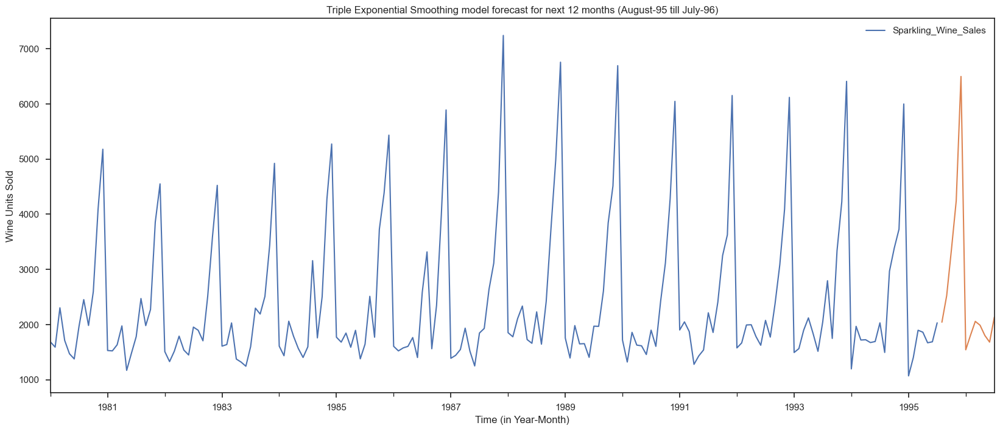

In [197]:
plt.figure(figsize=(18,9))
df.plot()
prediction.plot();
plt.title('Triple Exponential Smoothing model forecast for next 12 months (August-95 till July-96)')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [198]:
#In the below code, we have calculated the upper and lower confidence bands at 95% confidence level
#Here we are taking the multiplier to be 1.96 as we want to plot with respect to a 95% confidence intervals.
predicted_df = pd.DataFrame({'lower_ci':prediction - (1.96*np.std(TES_Fullmodel.resid,ddof=1)),
                          'prediction':prediction,
                          'upper_ci': prediction + (1.96*np.std(TES_Fullmodel.resid,ddof=1))})
predicted_df.head(12)

,lower_ci,prediction,upper_ci
1995-08-31,1310.263131,2043.554499,2776.845868
1995-09-30,1791.023166,2524.314535,3257.605903
1995-10-31,2628.977998,3362.269366,4095.560735
1995-11-30,3508.856307,4242.147675,4975.439044
1995-12-31,5764.964273,6498.255641,7231.547010
1996-01-31,809.718367,1543.009735,2276.301103
1996-02-29,1074.398934,1807.690303,2540.981671
1996-03-31,1324.763455,2058.054824,2791.346192
1996-04-30,1254.791901,1988.083270,2721.374638
1996-05-31,1069.937236,1803.228604,2536.519972


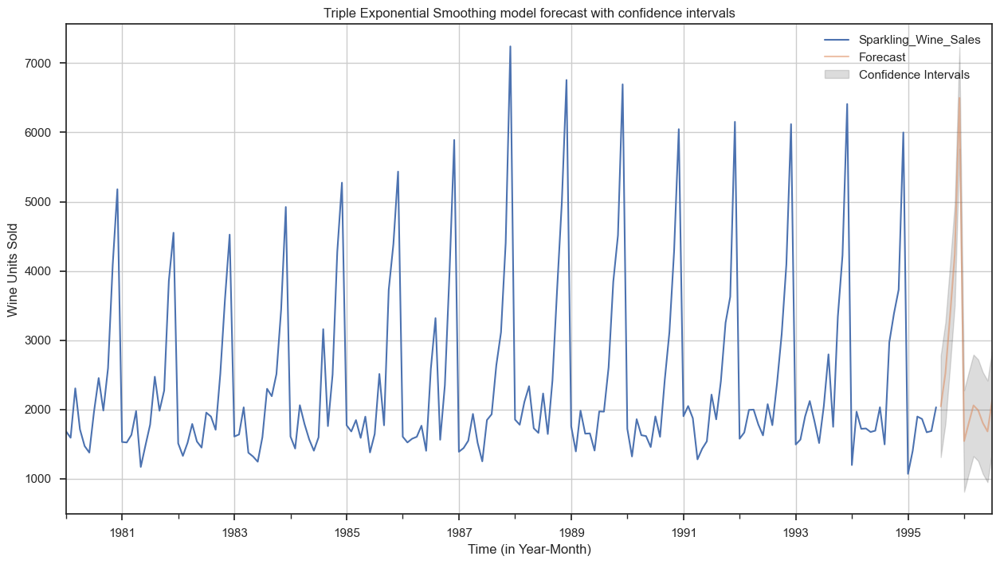

In [199]:
#plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='k', alpha=.15,label='Confidence Intervals')
plt.title('Triple Exponential Smoothing model forecast with confidence intervals')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

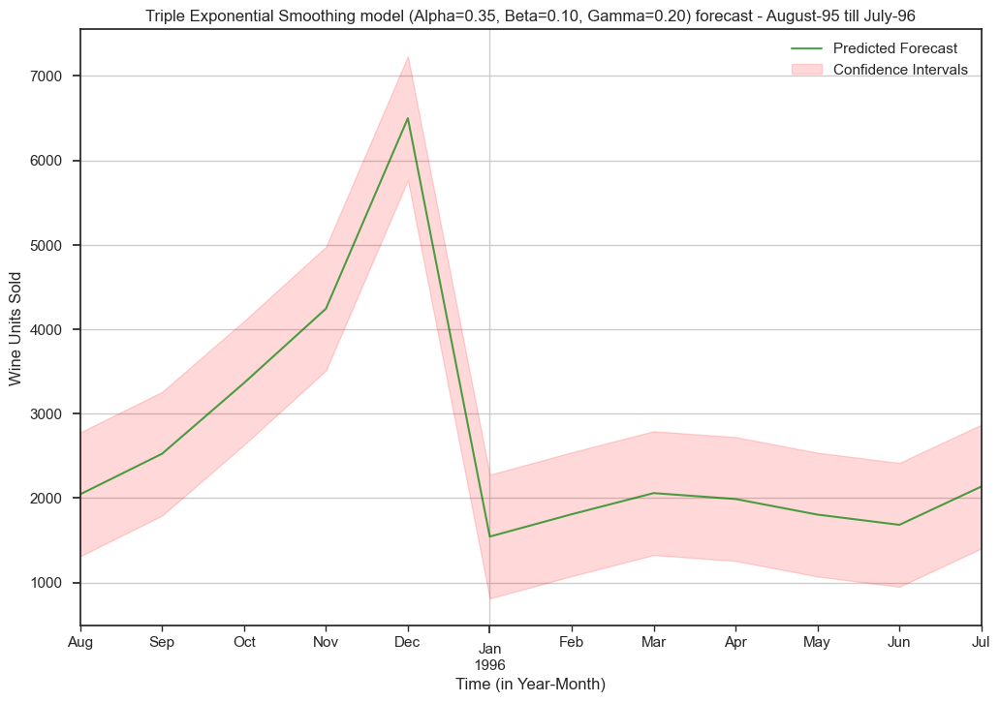

In [200]:
#plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = prediction.plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Triple Exponential Smoothing model (Alpha=0.35, Beta=0.10, Gamma=0.20) forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

Text(0, 0.5, 'Wine Units Sold')

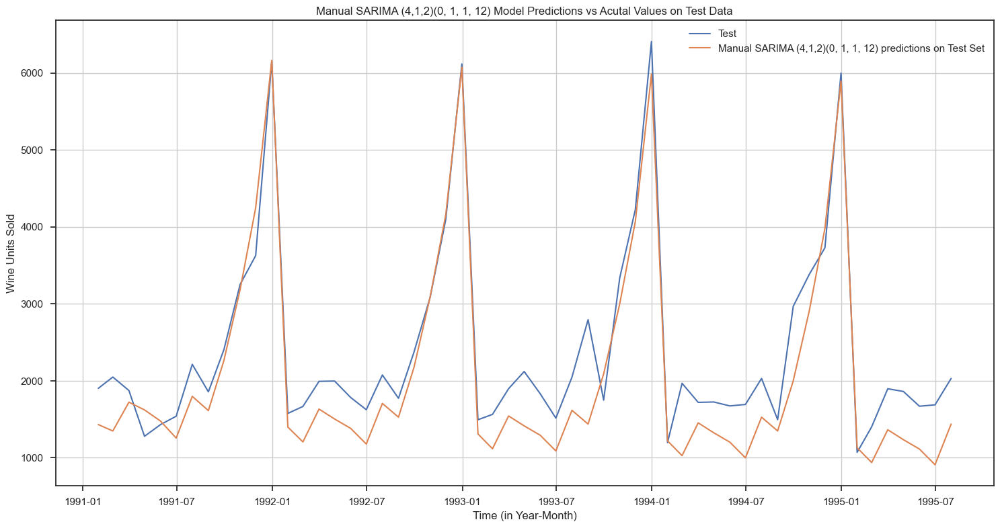

In [201]:
#Optimum Model - Manual SARIMA Model (4, 1, 2)(0, 1, 1, 12)
#Plotting on Test data

plt.figure(figsize=(18,9))
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) Model Predictions vs Acutal Values on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

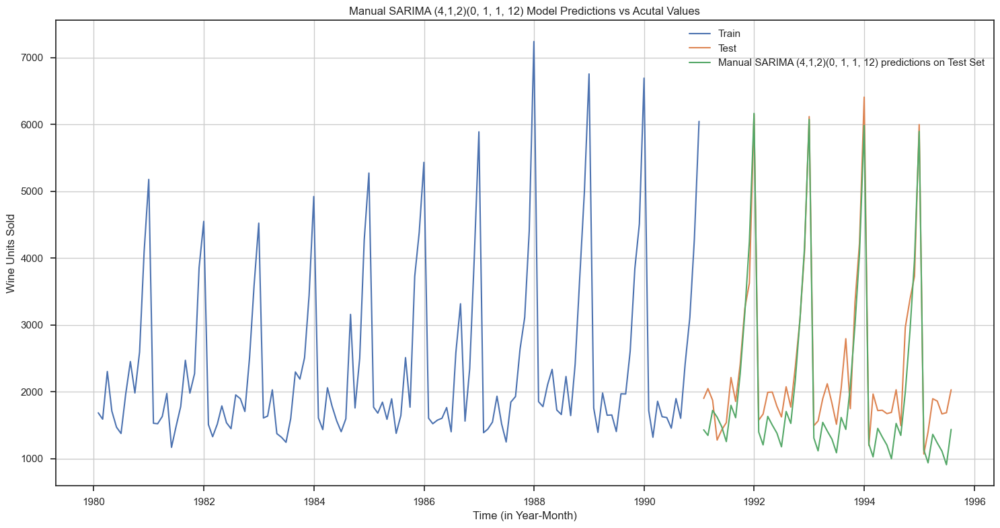

In [202]:
#Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling_Wine_Sales'], label='Train')
plt.plot(test['Sparkling_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) Model Predictions vs Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [203]:
Manual_Sarima_FullModel = sm.tsa.statespace.SARIMAX(df['Sparkling_Wine_Sales'],
                                order= (4, 1, 2), 
                                seasonal_order= (0, 1, 1, 12), 
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_fullmodel_manual_sarima = Manual_Sarima_FullModel.fit(maxiter=1000)
print(results_fullmodel_manual_sarima.summary())

                                      SARIMAX Results                                       
Dep. Variable:                 Sparkling_Wine_Sales   No. Observations:                  187
Model:             SARIMAX(4, 1, 2)x(0, 1, [1], 12)   Log Likelihood               -1171.945
Date:                              Sun, 12 Jan 2025   AIC                           2359.889
Time:                                      12:58:21   BIC                           2384.441
Sample:                                  01-31-1980   HQIC                          2369.859
                                       - 07-31-1995                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6275      0.517      1.214      0.225      -0.386       1.641
ar.L2         -0.15

In [204]:
predicted_manual_sarima_full_data = results_fullmodel_manual_sarima.get_forecast(steps=12)
predicted_manual_sarima_full_data.summary_frame(alpha=0.05).head()

Sparkling_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-31,1850.816159,381.837661,1102.428096,2599.204222
1995-09-30,2396.197138,387.330196,1637.043903,3155.350372
1995-10-31,3227.083942,387.331313,2467.928519,3986.239365
1995-11-30,3898.041321,389.053483,3135.510506,4660.572136
1995-12-31,6099.972218,389.123585,5337.304007,6862.640429


In [205]:
predicted_manual_sarima_df = predicted_manual_sarima_full_data.summary_frame(alpha=0.05)
predicted_manual_sarima_df

Sparkling_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-31,1850.816159,381.837661,1102.428096,2599.204222
1995-09-30,2396.197138,387.330196,1637.043903,3155.350372
1995-10-31,3227.083942,387.331313,2467.928519,3986.239365
1995-11-30,3898.041321,389.053483,3135.510506,4660.572136
1995-12-31,6099.972218,389.123585,5337.304007,6862.640429
1996-01-31,1231.640468,389.123586,468.972254,1994.308683
1996-02-29,1559.208192,389.810919,795.192831,2323.223554
1996-03-31,1801.347452,390.840417,1035.314312,2567.380593
1996-04-30,1780.037975,392.385715,1010.976106,2549.099844
1996-05-31,1627.830947,394.276653,855.062908,2400.598986


In [206]:
rmse_manual_sarima_full = metrics.mean_squared_error(df['Sparkling_Wine_Sales'],results_fullmodel_manual_sarima.fittedvalues,squared=False)

rmse_manual_sarima_full

577.5096432979202

In [207]:
#Getting the predictions for the 12 months into the future
prediction_manual_sarima_full = results_fullmodel_manual_sarima.forecast(steps=12)
prediction_manual_sarima_full.tail(12)

1995-08-31    1850.816159
1995-09-30    2396.197138
1995-10-31    3227.083942
1995-11-30    3898.041321
1995-12-31    6099.972218
1996-01-31    1231.640468
1996-02-29    1559.208192
1996-03-31    1801.347452
1996-04-30    1780.037975
1996-05-31    1627.830947
1996-06-30    1570.336070
1996-07-31    1979.250998
Freq: M, Name: predicted_mean, dtype: float64

Text(0, 0.5, 'Wine Units Sold')

<Figure size 1800x900 with 0 Axes>

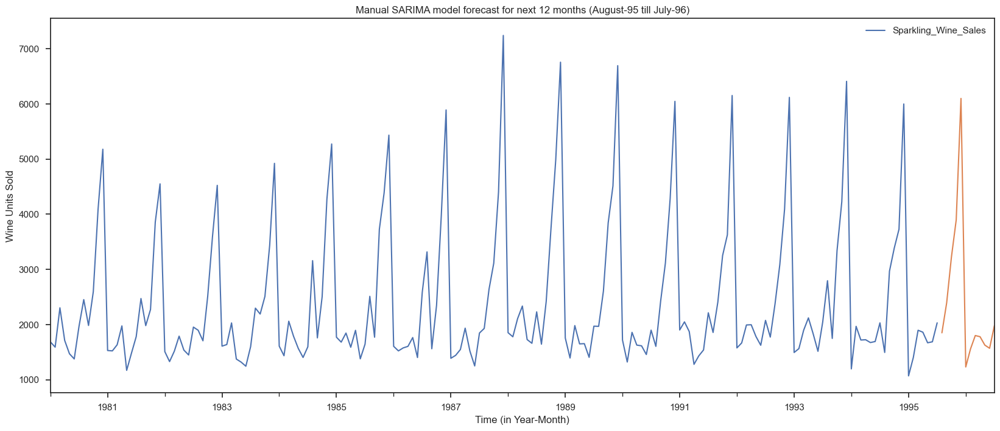

In [208]:
plt.figure(figsize=(18,9))
df.plot()
prediction_manual_sarima_full.plot();
plt.title('Manual SARIMA model forecast for next 12 months (August-95 till July-96)')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

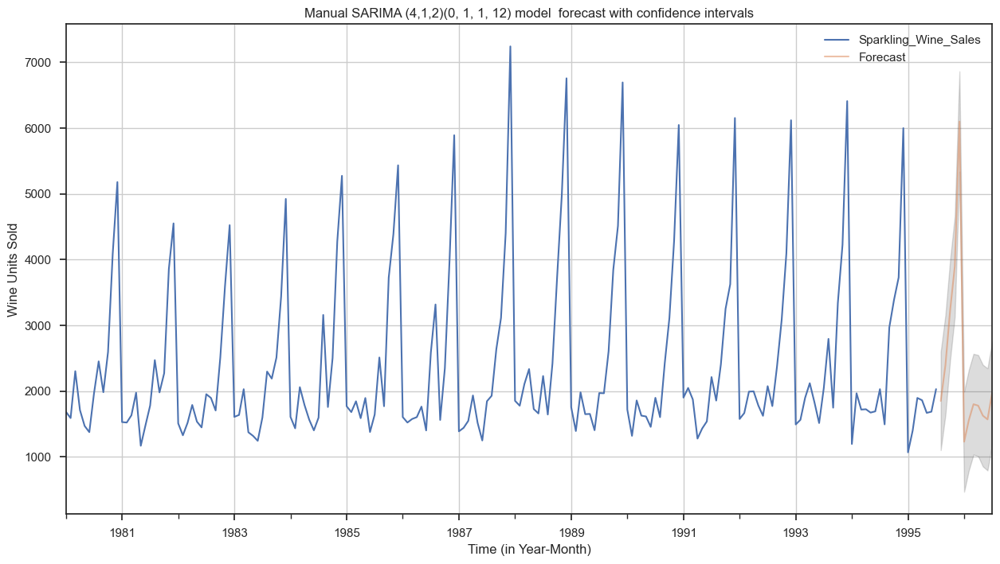

In [209]:
#plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_manual_sarima_df['mean'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_manual_sarima_df.index, predicted_manual_sarima_df['mean_ci_lower'], predicted_manual_sarima_df['mean_ci_upper'], color='k', alpha=.15)
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) model  forecast with confidence intervals')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

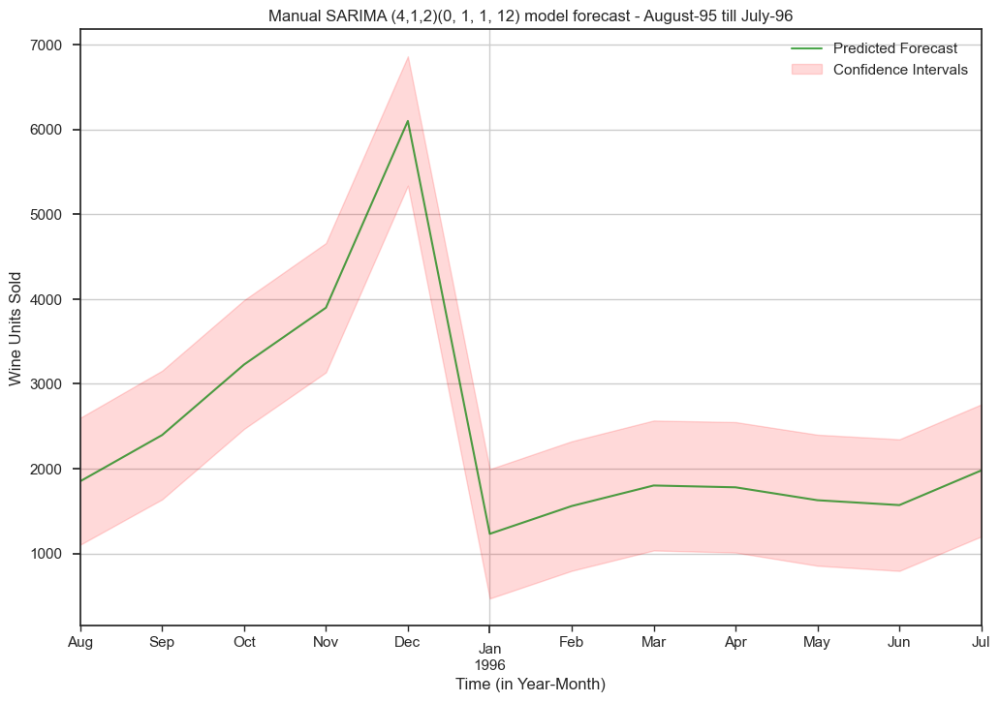

In [210]:
#plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = predicted_manual_sarima_df['mean'].plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_manual_sarima_df.index, predicted_manual_sarima_df['mean_ci_lower'], predicted_manual_sarima_df['mean_ci_upper'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Manual SARIMA (4,1,2)(0, 1, 1, 12) model forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

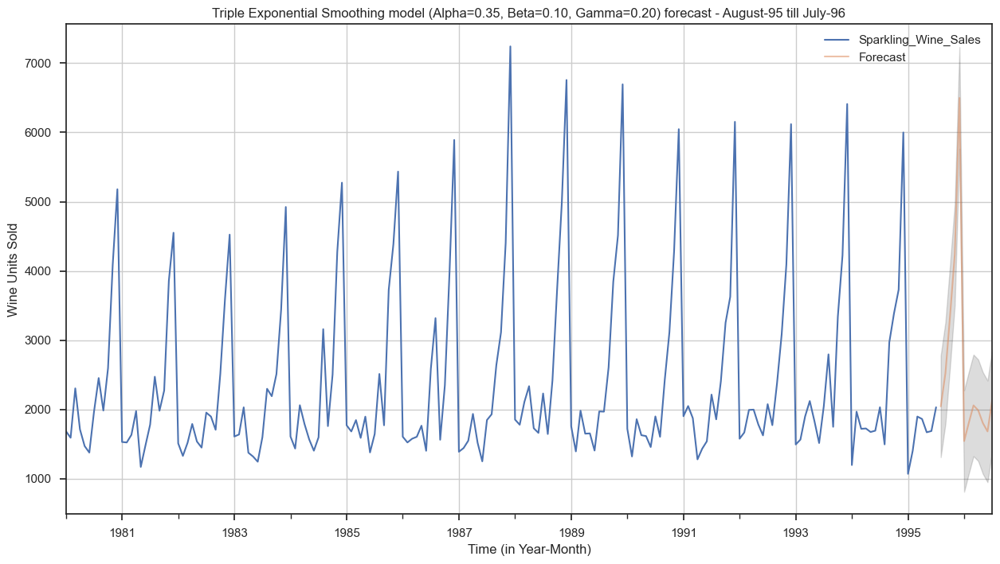

In [211]:
#Comment on the model thus built and report your findings and suggest the measures that the company should be taking for future sales.
#plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='k', alpha=.15)
plt.title('Triple Exponential Smoothing model (Alpha=0.35, Beta=0.10, Gamma=0.20) forecast - August-95 till July-96')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

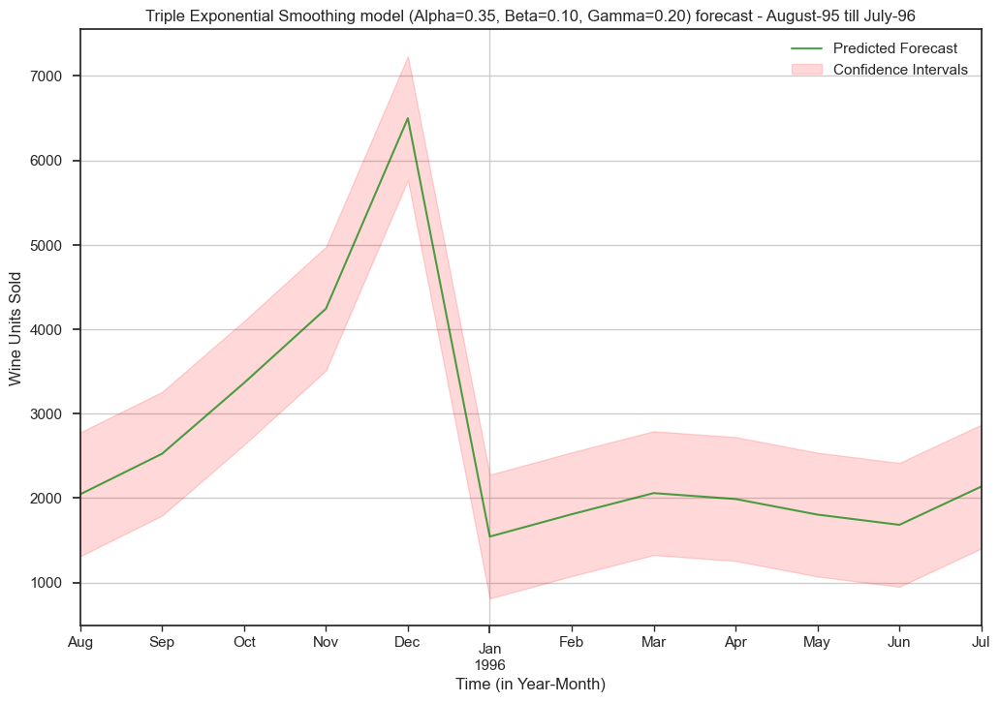

In [212]:
#plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = prediction.plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Triple Exponential Smoothing model (Alpha=0.35, Beta=0.10, Gamma=0.20) forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

In [213]:
TES_Fullmodel.forecast(steps=12)

1995-08-31    2043.554499
1995-09-30    2524.314535
1995-10-31    3362.269366
1995-11-30    4242.147675
1995-12-31    6498.255641
1996-01-31    1543.009735
1996-02-29    1807.690303
1996-03-31    2058.054824
1996-04-30    1988.083270
1996-05-31    1803.228604
1996-06-30    1682.347930
1996-07-31    2135.528887
Freq: M, dtype: float64

In [214]:
TES_Fullmodel.forecast(steps=12).describe()

count      12.000000
mean     2640.707106
std      1442.074541
min      1543.009735
25%      1806.574878
50%      2050.804661
75%      2733.803243
max      6498.255641
dtype: float64

In [215]:
#Calculating the percentage of sales in the last 4 months
(2527+3363+4240+6487)/TES_Fullmodel.forecast(steps=12).sum()

0.5243860619531557